In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches
import seaborn as sns

path_to_data = '/mnt/h0/kb/Feb2025/data_behav_psth/Good_sessions/'
EVENTS = ['feedback_times']

groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    # "VTA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R"],
    # "SNc": ["ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "DR": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "MR": ["ZFM-03062"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    # "LC_L": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06171", "ZFM-06275_L"],
    # "LC_R": ["ZFM-06272_R", "ZFM-06275_R"],
    # "ACh": ["ZFM-06305_L", "ZFM-06305_R", "ZFM-06948"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
    # "SI_R": ["ZFM-06305_R"]
}

In [2]:
def interpolate_to_common_time(psth, current_rate, target_rate, PERIEVENT_WINDOW):
    """Interpolate psth data to match the target sampling rate."""
    current_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth.shape[0])
    target_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], int((PERIEVENT_WINDOW[1] - PERIEVENT_WINDOW[0]) * target_rate))
    interpolated_psth = np.array([np.interp(target_time, current_time, psth[:, i]) for i in range(psth.shape[1])]).T
    return interpolated_psth

def plot_heatmap_psth_group(df_trials, psth_combined, EVENT="feedback_times", group_name='', PERIEVENT_WINDOW=[-1, 2], SAMPLING_RATE=30):
    """Plot side-by-side line plots for correct and incorrect trials with enhanced aesthetics."""
    
    # Extract correct and incorrect trials
    # psth_good = psth_combined[:, df_trials.feedbackType == 1]
    # psth_error = psth_combined[:, df_trials.feedbackType == -1]
    psth_good = psth_combined[:, df_trials.feedbackType.values == 1]
    psth_error = psth_combined[:, df_trials.feedbackType.values == -1]


    # Compute mean and SEM
    psth_good_avg = psth_good.mean(axis=1)
    sem_good = psth_good.std(axis=1) / np.sqrt(psth_good.shape[1])
    psth_error_avg = psth_error.mean(axis=1)
    sem_error = psth_error.std(axis=1) / np.sqrt(psth_error.shape[1])

    # Time axis
    time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth_combined.shape[0]) 

    # Create figure and axes
    fig, axes = plt.subplots(1, 2, figsize=(15, 5), dpi=300, sharey=True)

    # Define colors
    correct_color = '#2f9c95'
    incorrect_color = '#d62828'
    shadow_color_correct = '#577590'
    shadow_color_incorrect = '#903749'

    # Correct trials average plot
    axes[0].plot(time_axis, psth_good_avg, linewidth=2.5, color=correct_color, label="Correct")
    axes[0].fill_between(time_axis, psth_good_avg - sem_good, psth_good_avg + sem_good, color=shadow_color_correct, alpha=0.15)
    axes[0].axvline(x=0, color="black", linestyle="--", linewidth=2, label="Event Onset")
    axes[0].set_xlabel(f"Time since {EVENT} (s)", fontsize=20)
    axes[0].set_ylabel("Calcium Signal", fontsize=20)
    axes[0].set_title(f"Correct Trials", fontsize=20, pad=15)
    
    # Incorrect trials average plot
    axes[1].plot(time_axis, psth_error_avg, linewidth=2.5, color=incorrect_color, label="Incorrect")
    axes[1].fill_between(time_axis, psth_error_avg - sem_error, psth_error_avg + sem_error, color=shadow_color_incorrect, alpha=0.15)
    axes[1].axvline(x=0, color="black", linestyle="--", linewidth=2, label="Event Onset")
    axes[1].set_xlabel(f"Time since {EVENT} (s)", fontsize=20)
    axes[1].set_title(f"Incorrect Trials", fontsize=20, pad=15)


    # Remove top and right spines
    for ax in axes:
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.tick_params(axis='both', which='major', labelsize=16)

    # Create custom legend patches for shaded error regions
    shadow_legend_correct = mpatches.Patch(color=shadow_color_correct, alpha=0.15, label="SEM (Correct)")
    shadow_legend_incorrect = mpatches.Patch(color=shadow_color_incorrect, alpha=0.15, label="SEM (Incorrect)")

    # Create legend and place it outside
    legend = axes[1].legend(
        handles=[shadow_legend_correct, shadow_legend_incorrect] + axes[1].get_legend_handles_labels()[0], 
        fontsize=16, frameon=False, loc="upper left", bbox_to_anchor=(1, 1), handlelength=1.8, handleheight=1
    )

    plt.suptitle(f'{group_name}_{EVENT}', fontsize=14)
    plt.tight_layout()
    plt.show() 
#     # Save figures
    # save_path_png = f'/mnt/h0/kb/Feb2025/plots/Chapter4/Fig02_perNM_{df_trials.mouse.iloc[0]}_{df_trials.date.iloc[0]}_{group_name}_correct.png'
    # save_path_pdf = f'/mnt/h0/kb/Feb2025/plots/Chapter4/Fig02_perNM_{df_trials.mouse.iloc[0]}_{df_trials.date.iloc[0]}_{group_name}_correct.pdf'
    # save_path_png = f'/mnt/h0/kb/Feb2025/plots/Chapter4/Fig02_perNM_{df_trials.mouse.iloc[0]}_{df_trials.date.iloc[0]}_{group_name}_incorrect.png'
    # save_path_pdf = f'/mnt/h0/kb/Feb2025/plots/Chapter4/Fig02_perNM_{df_trials.mouse.iloc[0]}_{df_trials.date.iloc[0]}_{group_name}_incorrect.pdf'

    # plt.savefig(save_path_png, dpi=300)
    # plt.savefig(save_path_pdf, dpi=300)
    plt.show()





def pad_to_match_length(arr, target_length):
    """Pad or trim an array to match the target length along the time axis."""
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    """Load and pad/interpolate psth and df_trials for a group of mice to a common length."""
    combined_psth = []
    combined_trials = []
    target_rate = 30
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')
            
            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                psth = interpolate_to_common_time(psth, current_rate=15, target_rate=30, PERIEVENT_WINDOW=PERIEVENT_WINDOW)
                df_trials = pd.read_parquet(df_trials_path_15)
            else:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)
        
        except Exception as e:
            print(f"Error loading data for {mouse} | Event: {event}: {e}")
    
    if combined_psth and combined_trials:
        # Pad all PSTH arrays to match the longest one
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        return None, None

Processing group DA | Event: stimOnTrigger_times


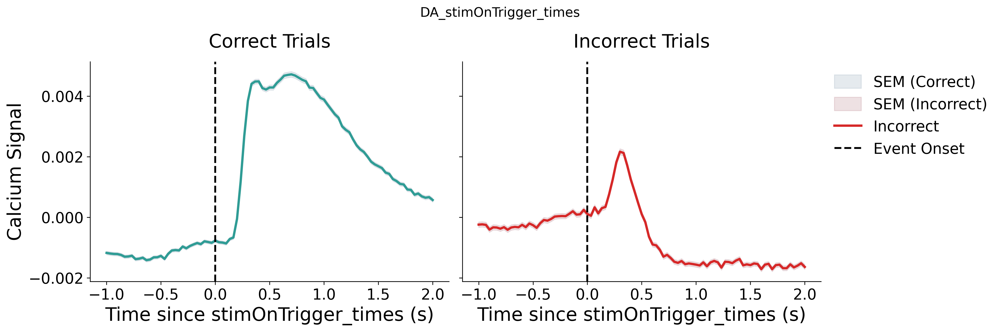

Processing group DA | Event: feedback_times


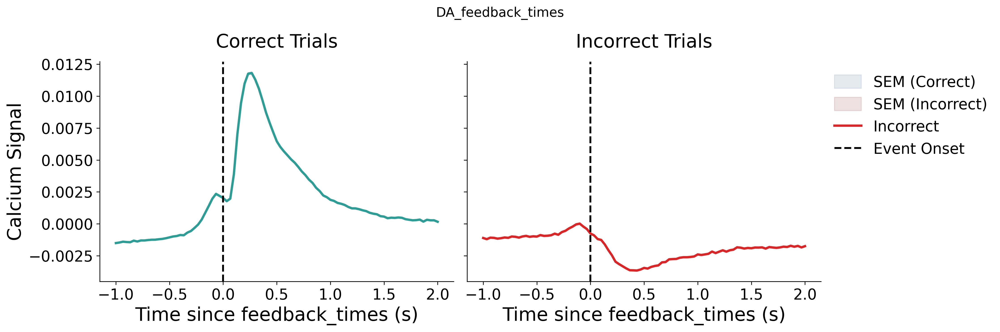

Processing group 5-HT | Event: stimOnTrigger_times


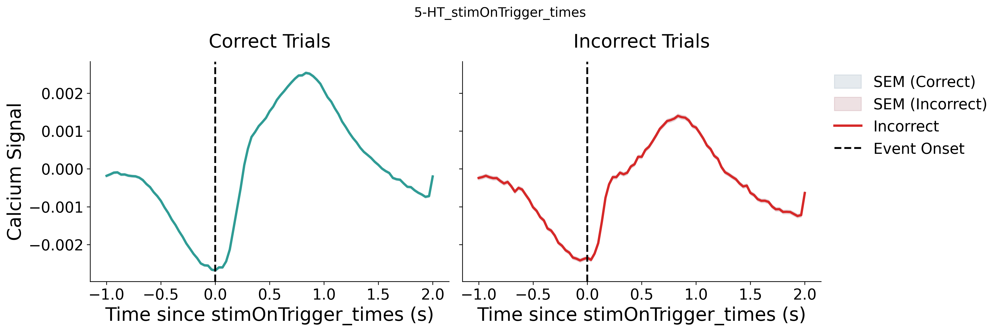

Processing group 5-HT | Event: feedback_times


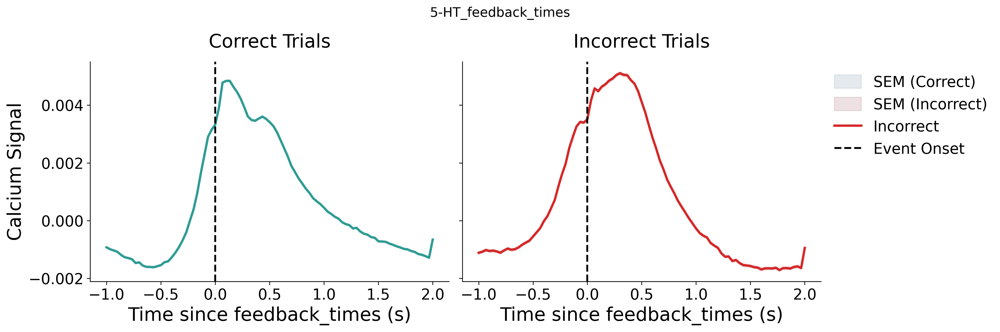

Processing group NE | Event: stimOnTrigger_times


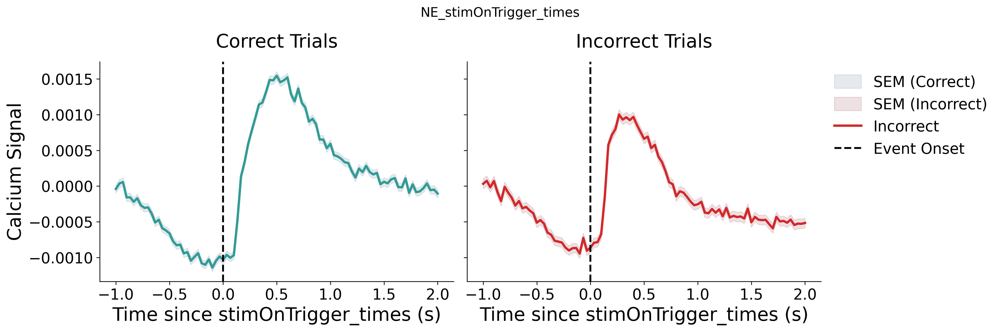

Processing group NE | Event: feedback_times


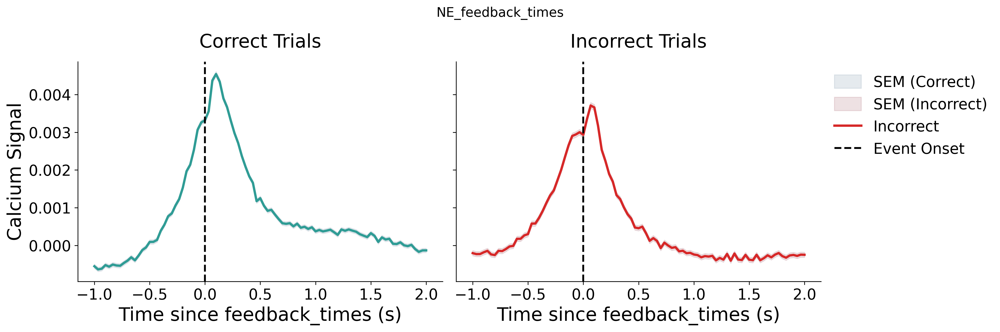

Processing group ACh | Event: stimOnTrigger_times


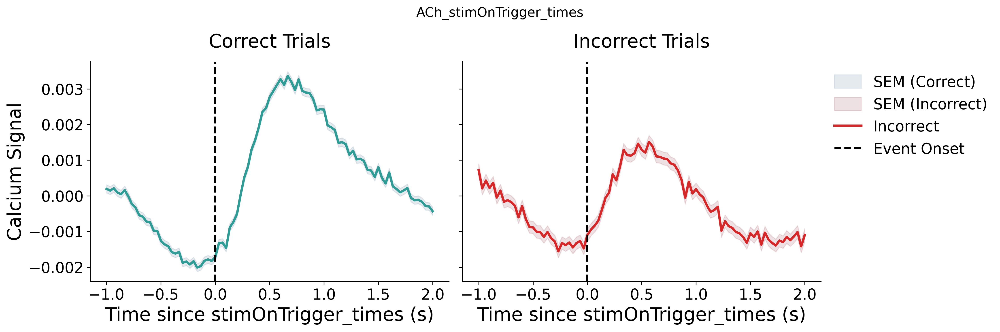

Processing group ACh | Event: feedback_times


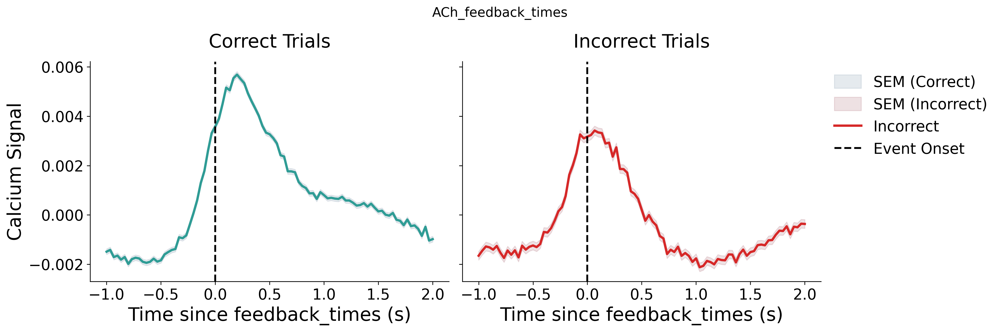

In [ ]:
EVENTS = ['stimOnTrigger_times', 'feedback_times']
for group_name, group_mice in groups.items():
    for event in EVENTS:
        print(f"Processing group {group_name} | Event: {event}")
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        
        if psth_combined is not None:
            plot_heatmap_psth_group(
                df_trials=df_trials_combined,
                psth_combined=psth_combined,
                EVENT=event,
                group_name=group_name,
                PERIEVENT_WINDOW=[-1, 2]
            )
        else:
            print(f"No data found for group {group_name} | Event: {event}.")

In [11]:
EVENTS

['stimOnTrigger_times', 'feedback_times']

In [12]:
df_trials_combined

,stimOnTrigger_times,quiescencePeriod,allContrasts,allSContrasts,goCueTrigger_times,goCue_times,response_times,choice,stimOn_times,contrastLeft,...,trialTime,trialNumber,probL,biasShift,mouse,region,stimOff_times,stimOffTrigger_times,repNum,included
0,5.309200,0.630937,0.5000,0.5000,5.409300,5.426800,21.003000,-1.0,NaN,NaN,...,22.603102,1,0.5,1,ZFM-06305,Region4G,NaN,NaN,NaN,NaN
1,29.895300,0.683849,0.5000,-0.5000,29.995400,30.023000,32.575300,1.0,NaN,0.50,...,10.965401,2,0.5,2,ZFM-06305,Region4G,NaN,NaN,NaN,NaN
2,36.246900,0.437500,1.0000,-1.0000,36.347000,36.376800,40.549100,-1.0,NaN,1.00,...,8.362902,3,0.5,3,ZFM-06305,Region4G,NaN,NaN,NaN,NaN
3,44.205699,0.466374,1.0000,-1.0000,44.305799,44.335799,48.663899,-1.0,NaN,1.00,...,7.524803,4,0.9,1,ZFM-06305,Region4G,NaN,NaN,NaN,NaN
4,53.789700,0.402212,1.0000,-1.0000,53.889800,53.920100,65.151700,-1.0,NaN,1.00,...,15.897602,5,0.9,2,ZFM-06305,Region4G,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10623,5549.917099,0.417085,0.2500,0.2500,5549.981399,5549.998899,5550.220699,-1.0,5549.981299,NaN,...,2.882002,1291,0.2,23,ZFM-06948,Region5G,NaN,NaN,NaN,True
10624,5553.399399,0.508537,1.0000,1.0000,5553.473099,5553.491299,5553.693299,-1.0,5553.472999,NaN,...,2.974302,1292,0.2,24,ZFM-06948,Region5G,NaN,NaN,NaN,True
10625,5557.027099,0.652400,0.0625,0.0625,5557.107899,5557.127799,5565.094799,1.0,5557.107799,NaN,...,11.790502,1293,0.2,25,ZFM-06948,Region5G,NaN,NaN,NaN,True
10626,5569.128500,0.446809,0.2500,0.2500,5569.206200,5569.224300,5569.477300,-1.0,5569.206100,NaN,...,2.966402,1294,0.2,26,ZFM-06948,Region5G,NaN,NaN,NaN,True


In [3]:

def plot_correct_vs_incorrect_by_NM(df_trials_dict, psth_dict, EVENT="feedback_times", PERIEVENT_WINDOW=[-1, 2], SAMPLING_RATE=30):
    """Plot side-by-side line plots for correct and incorrect trials across NM groups."""

    # Define colors for each NM
    color_palette = {
        "DA": "#FF3B25",   # Red
        "5-HT": "#9F4DF1", # Purple
        "NE": "#2198ED",   # Blue
        "ACh": "#45B437"   # Green
    }
    
    # Create figure and axes
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300, sharey=True)

    time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth_dict["DA"].shape[0]) 

    for nm, color in color_palette.items():
        if nm in psth_dict and psth_dict[nm] is not None:
            # Extract correct and incorrect trials
            psth_correct = psth_dict[nm][:, df_trials_dict[nm].feedbackType.values == 1]
            psth_incorrect = psth_dict[nm][:, df_trials_dict[nm].feedbackType.values == -1]

            # Compute means and SEM
            psth_correct_avg = psth_correct.mean(axis=1)
            sem_correct = psth_correct.std(axis=1) / np.sqrt(psth_correct.shape[1]) if psth_correct.shape[1] > 0 else np.zeros_like(psth_correct_avg)

            psth_incorrect_avg = psth_incorrect.mean(axis=1)
            sem_incorrect = psth_incorrect.std(axis=1) / np.sqrt(psth_incorrect.shape[1]) if psth_incorrect.shape[1] > 0 else np.zeros_like(psth_incorrect_avg)

            # Plot correct trials (Left)
            axes[0].plot(time_axis, psth_correct_avg, linewidth=2.5, color=color, label=f"{nm}")
            axes[0].fill_between(time_axis, psth_correct_avg - sem_correct, psth_correct_avg + sem_correct, color=color, alpha=0.15)

            # Plot incorrect trials (Right)
            axes[1].plot(time_axis, psth_incorrect_avg, linewidth=2.5, color=color, label=f"{nm}")
            axes[1].fill_between(time_axis, psth_incorrect_avg - sem_incorrect, psth_incorrect_avg + sem_incorrect, color=color, alpha=0.15)

    # Formatting and aesthetics
    for ax in axes:
        ax.axvline(x=0, color="black", linestyle="--", linewidth=2, label="Event Onset")
        # ax.set_xlabel(f"Time since {EVENT} (s)", fontsize=20)
        # ax.set_xlabel(f"Time since stimulus onset (s)", fontsize=20)
        ax.set_xlabel(f"Time since feedback (s)", fontsize=20)

        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.tick_params(axis='both', which='major', labelsize=16)

    axes[0].set_ylabel("Calcium Signal", fontsize=20)
    axes[0].set_title("Correct Trials", fontsize=20, pad=30)
    axes[1].set_title("Incorrect Trials", fontsize=20, pad=30)

    # Create legend
    legend_handles = [mpatches.Patch(color=color, label=nm) for nm, color in color_palette.items()]
    legend = axes[1].legend(handles=legend_handles, fontsize=16, frameon=False, loc="upper left", bbox_to_anchor=(1, 1), handlelength=1.8, handleheight=0.2)

    plt.suptitle(f"Correct and incorrect trials across neuromodulators", fontsize=22, y=1.05)
    plt.tight_layout()

df_trials_dict = {}
psth_dict = {}

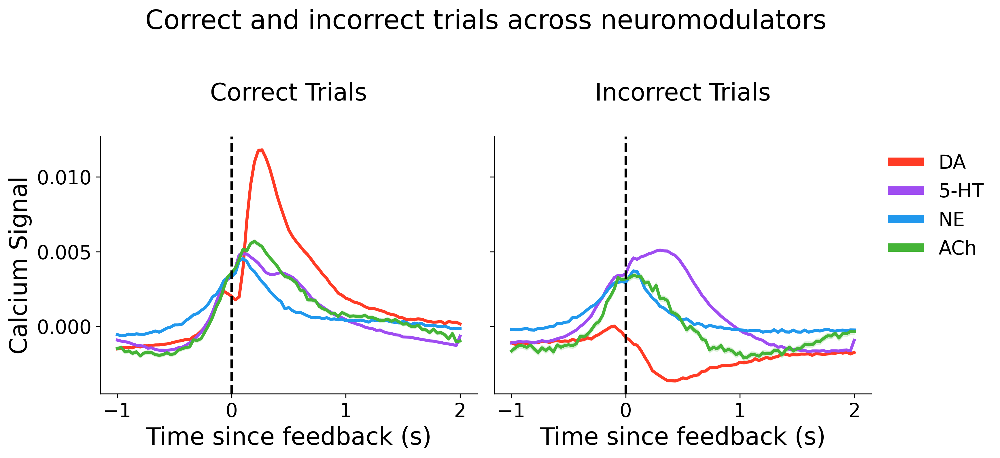

In [4]:

for group_name, group_mice in groups.items():
    # psth_combined, df_trials_combined = load_group_data(group_mice, "stimOnTrigger_times", path_to_data, PERIEVENT_WINDOW=[-1, 2])
    psth_combined, df_trials_combined = load_group_data(group_mice, "feedback_times", path_to_data, PERIEVENT_WINDOW=[-1, 2])
    
    if psth_combined is not None:
        df_trials_dict[group_name] = df_trials_combined
        psth_dict[group_name] = psth_combined
    else:
        print(f"No data found for {group_name}")

# Call the new plotting function
# plot_correct_vs_incorrect_by_NM(df_trials_dict, psth_dict, EVENT="stimOnTrigger_times")
plot_correct_vs_incorrect_by_NM(df_trials_dict, psth_dict, EVENT="feedback_times")

Processing group DA | Event: stimOnTrigger_times
Processing group DA | Event: feedback_times


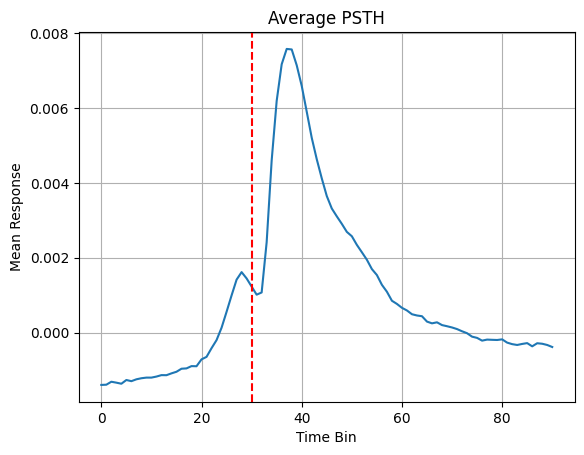

/tmp/ipykernel_2442464/3398090251.py:84: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_melted, x="Time Window", y="Avg ΔF/F", palette=["skyblue", "lightgreen", "coral"])
/tmp/ipykernel_2442464/3398090251.py:85: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=df_melted, x="Time Window", y="Avg ΔF/F", palette=["gray", "gray", "gray"], size=2, alpha=0.01, jitter=True)


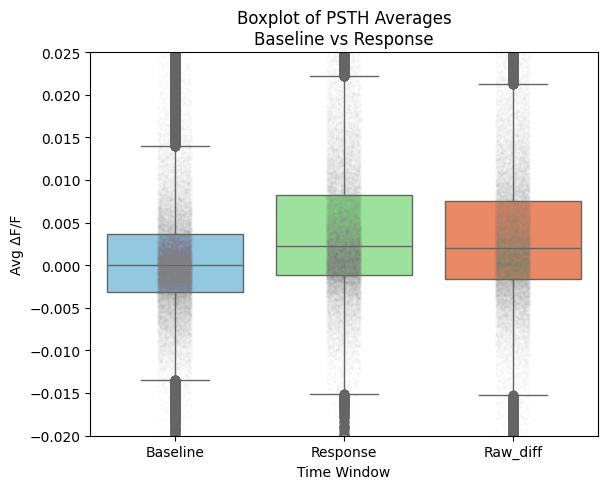

In [5]:
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"]
}

EVENTS = ['stimOnTrigger_times', 'feedback_times']
for group_name, group_mice in groups.items():
    for event in EVENTS:
        print(f"Processing group {group_name} | Event: {event}")
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        
        # if psth_combined is not None:
        #     plot_heatmap_psth_group(
        #         df_trials=df_trials_combined,
        #         psth_combined=psth_combined,
        #         EVENT=event,
        #         group_name=group_name,
        #         PERIEVENT_WINDOW=[-1, 2]
        #     )
        # else:
        #     print(f"No data found for group {group_name} | Event: {event}.")



if psth_combined.shape[0] == 91:
    psth_combined = psth_combined.T  # Now shape = (10628, 91)

# Compute mean across trials (axis 0), resulting in 91 values
mean_psth = np.mean(psth_combined, axis=0)

# Plotting
plt.plot(mean_psth)
plt.xlabel("Time Bin")
plt.ylabel("Mean Response")
plt.title("Average PSTH")
plt.grid(True)
plt.axvline(x=30, color='r', linestyle='--', label='Event Onset')
plt.show()





import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Time vector from -1 to 2 seconds, 91 bins
time_vector = np.linspace(-1, 2, 91)

# 2. Define ranges
baseline_range = (-0.2, 0)
response_range = (0, 0.5)

# 3. Get index positions for baseline and response
baseline_idx = np.where((time_vector >= baseline_range[0]) & (time_vector < baseline_range[1]))[0]
response_idx = np.where((time_vector >= response_range[0]) & (time_vector < response_range[1]))[0]

# 4. Check and transpose if needed
if psth_combined.shape[0] == 91:
    psth_combined = psth_combined.T  # shape becomes (35690, 91)

# 5. Average PSTH signal over each time window (per row/trial)
baseline_avg = np.mean(psth_combined[:, baseline_idx], axis=1)  
response_avg = np.mean(psth_combined[:, response_idx], axis=1)  

# 6. Compute raw difference and normalized difference
raw_diff = response_avg - baseline_avg
epsilon = 1e-6  # to avoid division by zero
normalized_diff = raw_diff / (baseline_avg + epsilon)  # shape: (35690,)


# Prepare data in long format
df_box = pd.DataFrame({
    "Baseline": baseline_avg,
    "Response": response_avg, 
    "Raw_diff": raw_diff
})

# Melt the dataframe to long format for seaborn
df_melted = df_box.melt(var_name="Time Window", value_name="Avg ΔF/F")

# Plot boxplot
plt.figure(figsize=(6, 5))
sns.boxplot(data=df_melted, x="Time Window", y="Avg ΔF/F", palette=["skyblue", "lightgreen", "coral"])
sns.stripplot(data=df_melted, x="Time Window", y="Avg ΔF/F", palette=["gray", "gray", "gray"], size=2, alpha=0.01, jitter=True)
plt.title("Boxplot of PSTH Averages\nBaseline vs Response")
plt.tight_layout()
plt.ylim(-0.02,0.025)
plt.show()


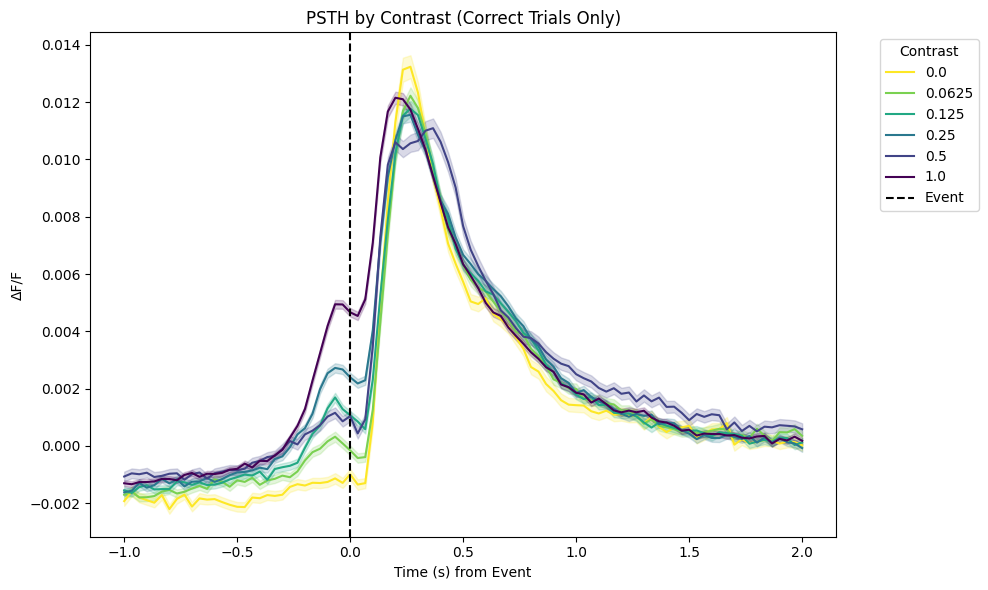

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Time vector
time_vector = np.linspace(-1, 2, 91)

# Step 2: Get unique sorted contrast levels
df_trials_combined["allContrasts"] = pd.to_numeric(df_trials_combined["allContrasts"], errors="coerce")
contrast_levels = sorted(df_trials_combined["allContrasts"].dropna().unique())

# Step 3: Plot
plt.figure(figsize=(10, 6))

colors = plt.cm.viridis_r(np.linspace(0, 1, len(contrast_levels)))  # color per contrast

for i, contrast in enumerate(contrast_levels):
    # Create mask for correct trials at this contrast
    mask = (df_trials_combined["feedbackType"] == 1) & (df_trials_combined["allContrasts"] == contrast)
    
    if mask.sum() == 0:
        continue  # skip if no trials

    # Extract and compute mean & SEM
    psth_subset = psth_combined[mask.values, :]  # shape: (n_trials, 91)
    mean_psth = np.mean(psth_subset, axis=0)
    sem_psth = np.std(psth_subset, axis=0) / np.sqrt(psth_subset.shape[0])

    # Plot line and shaded area
    plt.plot(time_vector, mean_psth, label=f"{contrast}", color=colors[i])
    plt.fill_between(time_vector, mean_psth - sem_psth, mean_psth + sem_psth, color=colors[i], alpha=0.2)

# Final formatting
plt.axvline(0, color="black", linestyle="--", label="Event")
plt.title("PSTH by Contrast (Correct Trials Only)")
plt.xlabel("Time (s) from Event")
plt.ylabel("ΔF/F")
plt.legend(title="Contrast", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Processing group DA | Event: stimOnTrigger_times


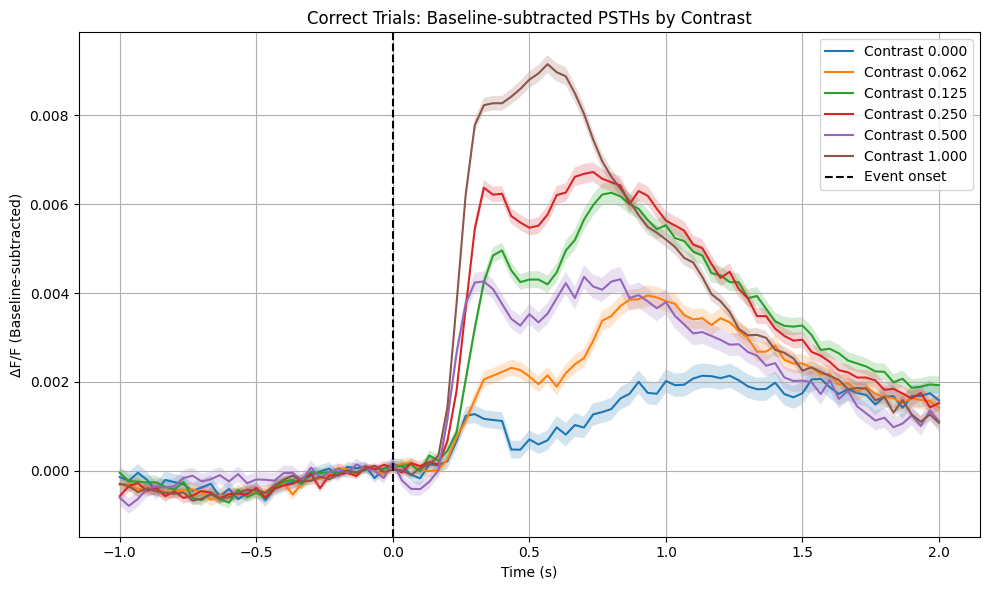

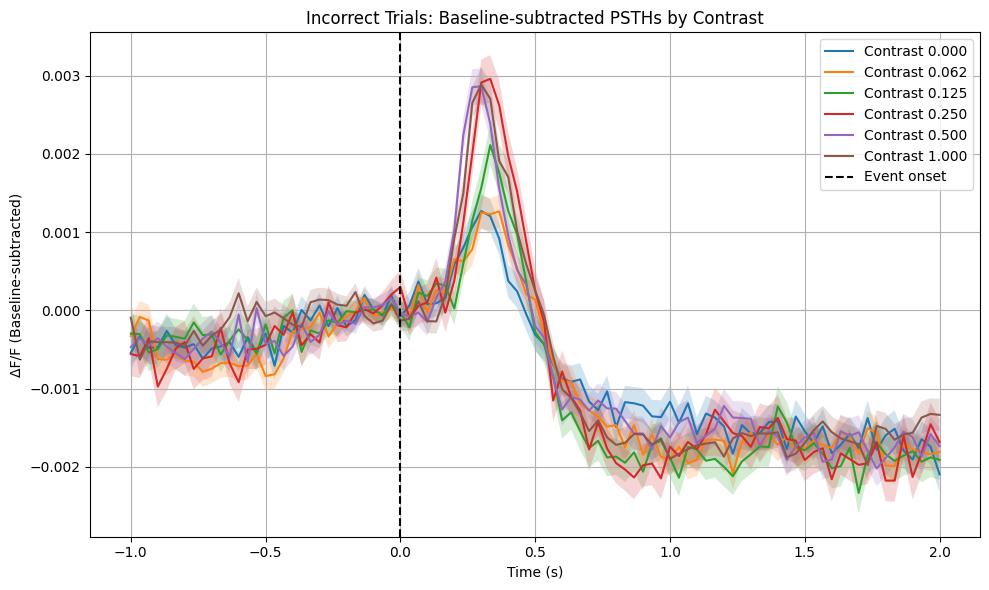

In [7]:
""" 27May2025 - working """
import numpy as np

# 0. choose the event 
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"]
}

EVENTS = ['stimOnTrigger_times'] 
# EVENTS = ['stimOnTrigger_times', 'feedback_times'] 
for group_name, group_mice in groups.items():
    for event in EVENTS:
        print(f"Processing group {group_name} | Event: {event}")
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
if psth_combined.shape[0] == 91:
    psth_combined = psth_combined.T  # Now shape = (10628, 91)

        
# 1. Time vector
time_vector = np.linspace(-1, 2, 91)

# 2. Indices for baseline and response windows
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]

# 3. Get unique contrasts
unique_contrasts = np.unique(df_trials_combined['allContrasts'].values)

# 4. Prepare dictionaries for correct and incorrect trials
groups = {
    "correct": df_trials_combined['feedbackType'].values == 1,
    "incorrect": df_trials_combined['feedbackType'].values == -1
}

# To store normalized and aligned PSTHs
results = {
    "correct": {
        "aligned_mean": {},
        "aligned_sem": {},
        "normalized_mean": {},
        "normalized_sem": {}
    },
    "incorrect": {
        "aligned_mean": {},
        "aligned_sem": {},
        "normalized_mean": {},
        "normalized_sem": {}
    }
}

epsilon = 1e-6

# 5. Loop over group (correct/incorrect)
for group_name, group_mask in groups.items():
    # Loop over contrasts
    for contrast in unique_contrasts:
        # Get trials for this contrast and feedbackType group
        idx = (df_trials_combined['allContrasts'].values == contrast) & group_mask
        psth_subset = psth_combined[idx]

        if psth_subset.shape[0] == 0:
            continue  # skip if no trials for this condition

        # Compute baseline mean per trial (shape: [n_trials, 1])
        baseline_mean = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)

        # Subtract baseline from entire PSTH trace (trial-wise)
        aligned_psth = psth_subset - baseline_mean  # shape: (n_trials, 91)

        # Normalize using trial-wise baseline
        normalized_psth = aligned_psth / (baseline_mean + epsilon)

        # Store mean and SEM across trials
        results[group_name]["aligned_mean"][contrast] = np.mean(aligned_psth, axis=0)
        results[group_name]["aligned_sem"][contrast] = np.std(aligned_psth, axis=0, ddof=1) / np.sqrt(aligned_psth.shape[0])

        results[group_name]["normalized_mean"][contrast] = np.mean(normalized_psth[:, response_idx], axis=0).squeeze()
        results[group_name]["normalized_sem"][contrast] = np.std(normalized_psth[:, response_idx], axis=0, ddof=1).squeeze() / np.sqrt(normalized_psth.shape[0])

# 6. Plot: Aligned PSTHs per contrast (correct trials)
plt.figure(figsize=(10, 6))
for contrast in sorted(results["correct"]["aligned_mean"].keys()):
    mean_trace = results["correct"]["aligned_mean"][contrast]
    sem_trace = results["correct"]["aligned_sem"][contrast]
    plt.plot(time_vector, mean_trace, label=f"Contrast {contrast:.3f}")
    plt.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, alpha=0.2)

plt.title("Correct Trials: Baseline-subtracted PSTHs by Contrast")
plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (Baseline-subtracted)")
plt.axvline(0, color='k', linestyle='--', label='Event onset')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#for incorrect trials
plt.figure(figsize=(10, 6))
for contrast in sorted(results["incorrect"]["aligned_mean"].keys()):
    mean_trace = results["incorrect"]["aligned_mean"][contrast]
    sem_trace = results["incorrect"]["aligned_sem"][contrast]
    plt.plot(time_vector, mean_trace, label=f"Contrast {contrast:.3f}")
    plt.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, alpha=0.2)

plt.title("Incorrect Trials: Baseline-subtracted PSTHs by Contrast")
plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (Baseline-subtracted)")
plt.axvline(0, color='k', linestyle='--', label='Event onset')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




Processing group DA | Event: stimOnTrigger_times


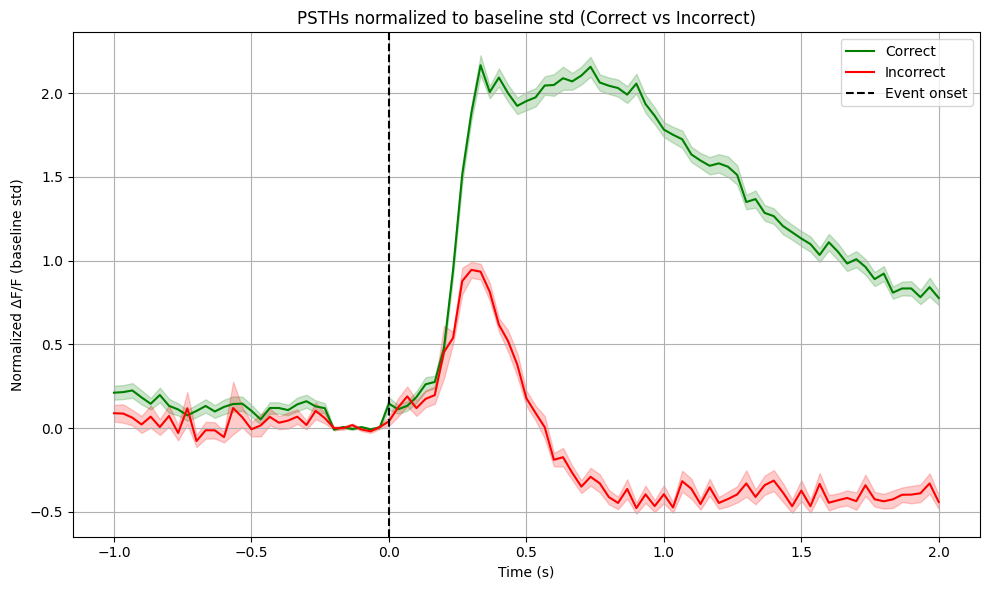

In [8]:
""" working v2 """
# 0. choose the event 
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"]
}

EVENTS = ['stimOnTrigger_times'] 
for group_name, group_mice in groups.items():
    for event in EVENTS:
        print(f"Processing group {group_name} | Event: {event}")
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])

# If PSTH was transposed earlier, fix shape
if psth_combined.shape[0] == 91:
    psth_combined = psth_combined.T  # Now shape = (n_trials, 91)

# 1. Time vector and baseline indices
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]

# 2. Small constant to avoid divide-by-zero
epsilon = 1e-6

# 3. Masks for trial types
correct_mask = df_trials_combined['feedbackType'].values == 1
incorrect_mask = df_trials_combined['feedbackType'].values == -1

# 4. Align and normalize function (baseline-std normalization)
def align_and_normalize(psth_subset):
    # Baseline mean and std per trial
    baseline_value = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
    baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)

    # Align: subtract baseline mean
    aligned_psth = psth_subset - baseline_value

    # Normalize: divide by baseline std
    normalized_psth = aligned_psth / (baseline_std + epsilon)

    # Mean and SEM across trials
    mean_trace = np.mean(normalized_psth, axis=0)
    sem_trace = np.std(normalized_psth, axis=0, ddof=1) / np.sqrt(normalized_psth.shape[0])

    return normalized_psth, mean_trace, sem_trace

# 5. Apply to correct and incorrect trials
normalized_psth_c, mean_correct, sem_correct = align_and_normalize(psth_combined[correct_mask])
normalized_psth_inc, mean_incorrect, sem_incorrect = align_and_normalize(psth_combined[incorrect_mask])

# 6. Plot both traces
plt.figure(figsize=(10, 6))

plt.plot(time_vector, mean_correct, label='Correct', color='green')
plt.fill_between(time_vector, mean_correct - sem_correct, mean_correct + sem_correct, color='green', alpha=0.2)

plt.plot(time_vector, mean_incorrect, label='Incorrect', color='red')
plt.fill_between(time_vector, mean_incorrect - sem_incorrect, mean_incorrect + sem_incorrect, color='red', alpha=0.2)

plt.axvline(0, color='k', linestyle='--', label='Event onset')
plt.xlabel("Time (s)")
plt.ylabel("Normalized ΔF/F (baseline std)")
plt.title("PSTHs normalized to baseline std (Correct vs Incorrect)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


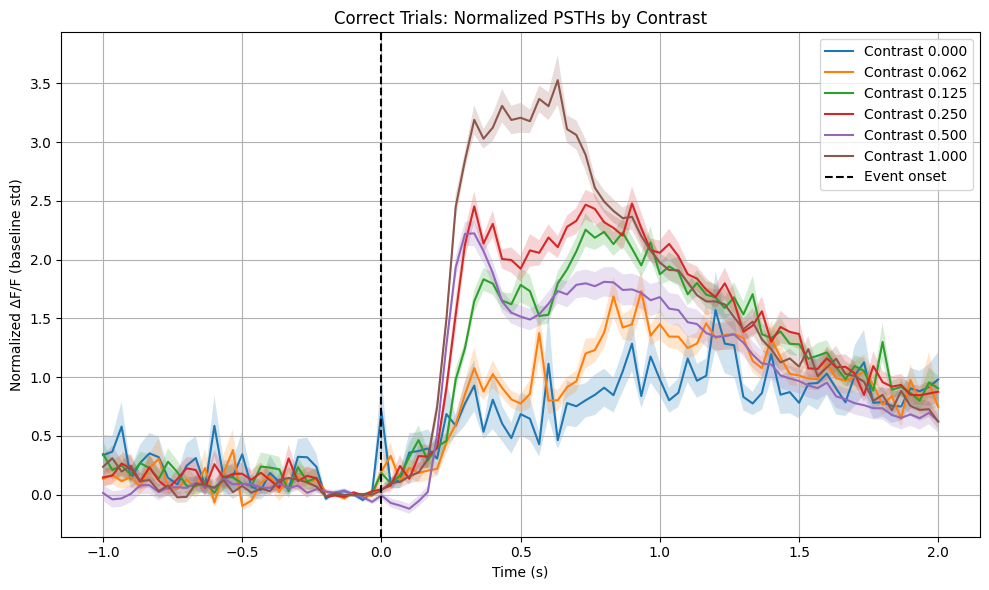

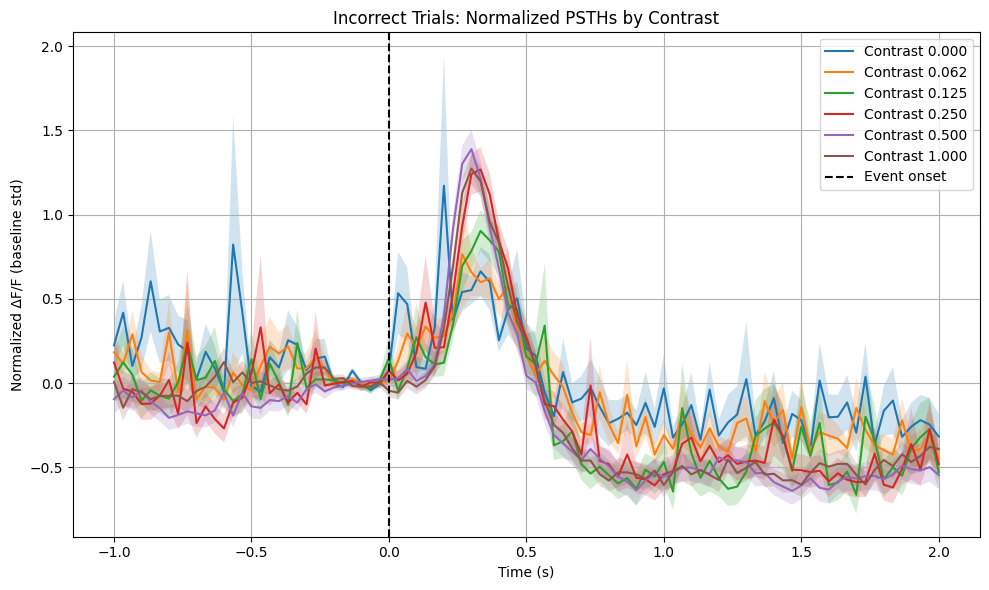

In [9]:
# %%
import numpy as np
import matplotlib.pyplot as plt

# Time and baseline indices
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
epsilon = 1e-6

# Trial group masks
correct_mask = df_trials_combined['feedbackType'].values == 1
incorrect_mask = df_trials_combined['feedbackType'].values == -1

# Unique contrast levels
unique_contrasts = np.unique(df_trials_combined['allContrasts'].values)

# Function to align & normalize per trial
def align_and_normalize(psth_subset):
    baseline_value = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
    baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
    aligned_psth = psth_subset - baseline_value
    normalized_psth = aligned_psth / (baseline_std + epsilon)
    return normalized_psth

# Function to process and plot each group
def process_and_plot(group_name, trial_mask):
    plt.figure(figsize=(10, 6))
    for contrast in sorted(unique_contrasts):
        contrast_mask = df_trials_combined['allContrasts'].values == contrast
        idx = trial_mask & contrast_mask
        if np.sum(idx) < 5:  # skip very low trial counts
            continue

        psth_subset = psth_combined[idx]
        normalized_psth = align_and_normalize(psth_subset)

        mean_trace = np.mean(normalized_psth, axis=0)
        sem_trace = np.std(normalized_psth, axis=0, ddof=1) / np.sqrt(normalized_psth.shape[0])

        plt.plot(time_vector, mean_trace, label=f"Contrast {contrast:.3f}")
        plt.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, alpha=0.2)

    plt.axvline(0, color='k', linestyle='--', label='Event onset')
    plt.title(f"{group_name.capitalize()} Trials: Normalized PSTHs by Contrast")
    plt.xlabel("Time (s)")
    plt.ylabel("Normalized ΔF/F (baseline std)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Plot correct and incorrect groups
process_and_plot("correct", correct_mask)
process_and_plot("incorrect", incorrect_mask)


Processing group DA | Event: stimOnTrigger_times


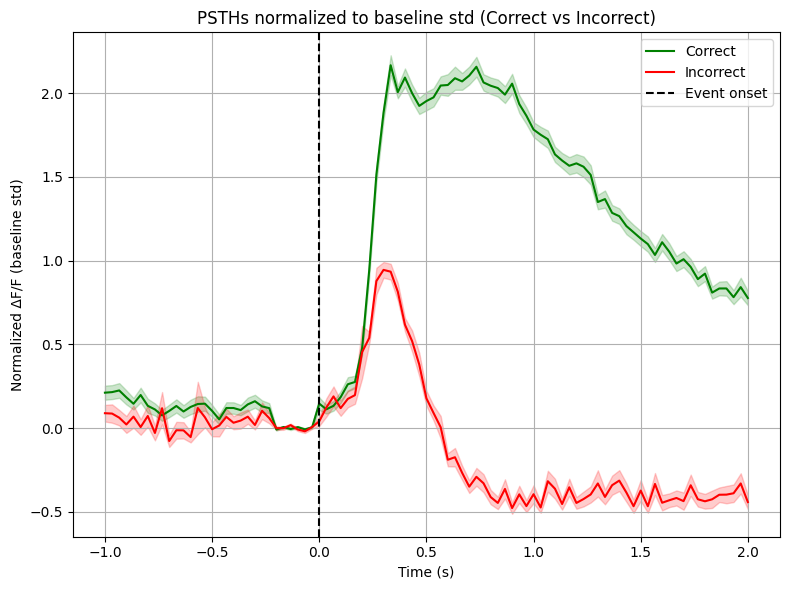

In [21]:
""" PERFECT aligned and normalized """ 
# 0. choose the event 
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"]
}

EVENTS = ['stimOnTrigger_times'] 
for group_name, group_mice in groups.items():
    for event in EVENTS:
        print(f"Processing group {group_name} | Event: {event}")
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])

# If PSTH was transposed earlier, fix shape
if psth_combined.shape[0] == 91:
    psth_combined = psth_combined.T  # Now shape = (n_trials, 91)

# 1. Time vector and baseline indices
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]

# 2. Small constant to avoid divide-by-zero
epsilon = 1e-6

# 3. Masks for trial types
correct_mask = df_trials_combined['feedbackType'].values == 1
incorrect_mask = df_trials_combined['feedbackType'].values == -1

# 4. Align and normalize function (baseline-std normalization)
def align_and_normalize(psth_subset):
    # Baseline mean and std per trial
    baseline_value = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
    baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)

    # Align: subtract baseline mean
    aligned_psth = psth_subset - baseline_value

    # Normalize: divide by baseline std
    normalized_psth = aligned_psth / (baseline_std + epsilon)

    # Mean and SEM across trials
    mean_trace = np.mean(normalized_psth, axis=0)
    sem_trace = np.std(normalized_psth, axis=0, ddof=1) / np.sqrt(normalized_psth.shape[0])

    return normalized_psth, mean_trace, sem_trace

# 5. Apply to correct and incorrect trials
normalized_psth_c, mean_correct, sem_correct = align_and_normalize(psth_combined[correct_mask])
normalized_psth_inc, mean_incorrect, sem_incorrect = align_and_normalize(psth_combined[incorrect_mask])

# 6. Plot both traces
plt.figure(figsize=(8, 6))

plt.plot(time_vector, mean_correct, label='Correct', color='green')
plt.fill_between(time_vector, mean_correct - sem_correct, mean_correct + sem_correct, color='green', alpha=0.2)

plt.plot(time_vector, mean_incorrect, label='Incorrect', color='red')
plt.fill_between(time_vector, mean_incorrect - sem_incorrect, mean_incorrect + sem_incorrect, color='red', alpha=0.2)

plt.axvline(0, color='k', linestyle='--', label='Event onset')
plt.xlabel("Time (s)")
plt.ylabel("Normalized ΔF/F (baseline std)")
plt.title("PSTHs normalized to baseline std (Correct vs Incorrect)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Processing group DA | Event: stimOnTrigger_times


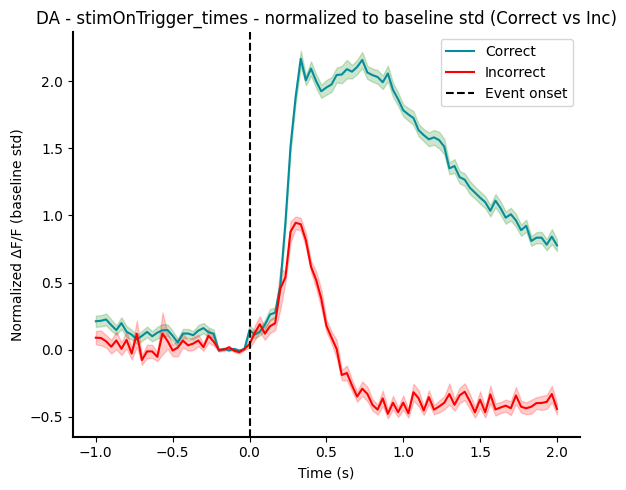

Processing group DA | Event: feedback_times


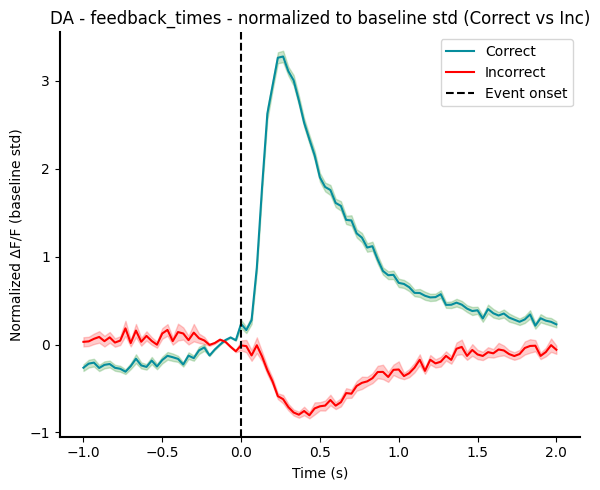

Processing group 5-HT | Event: stimOnTrigger_times


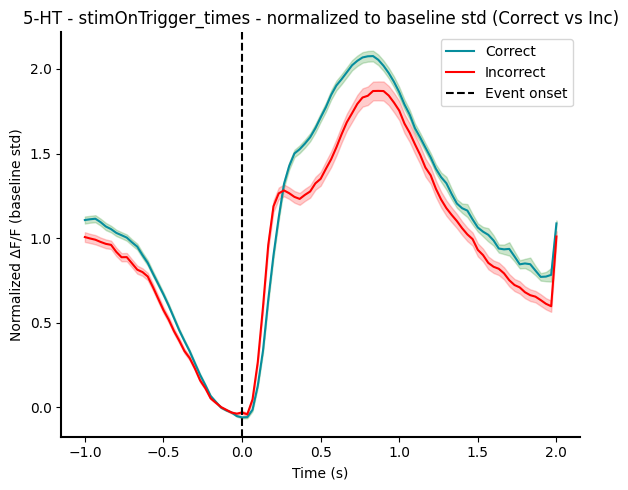

Processing group 5-HT | Event: feedback_times


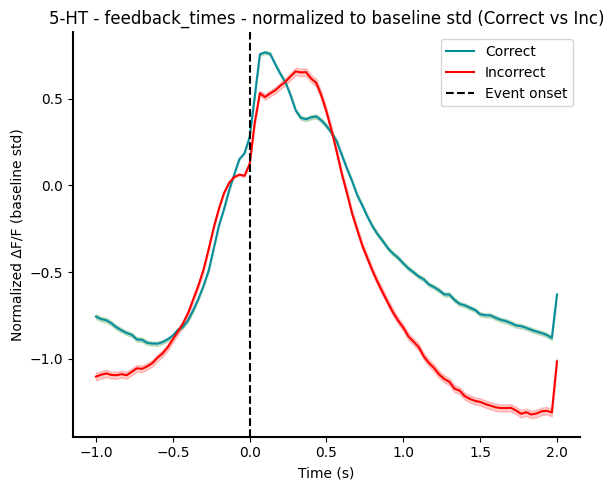

Processing group NE | Event: stimOnTrigger_times


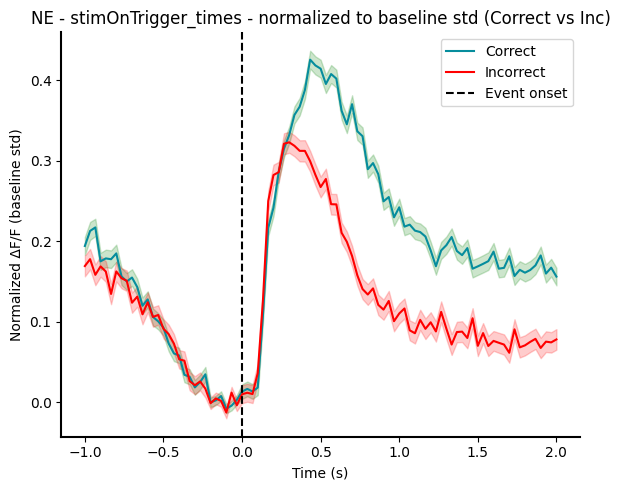

Processing group NE | Event: feedback_times


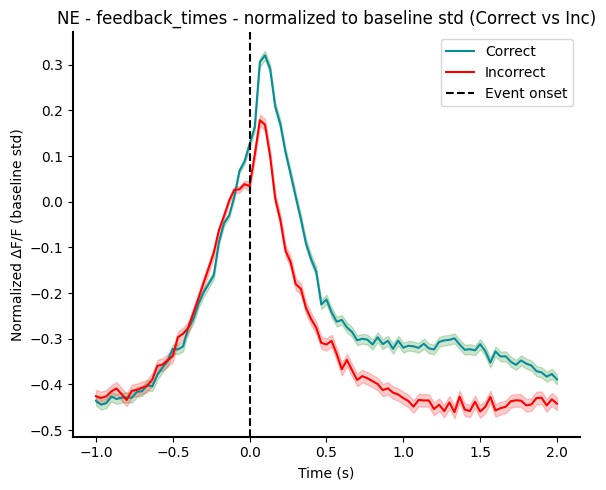

Processing group ACh | Event: stimOnTrigger_times


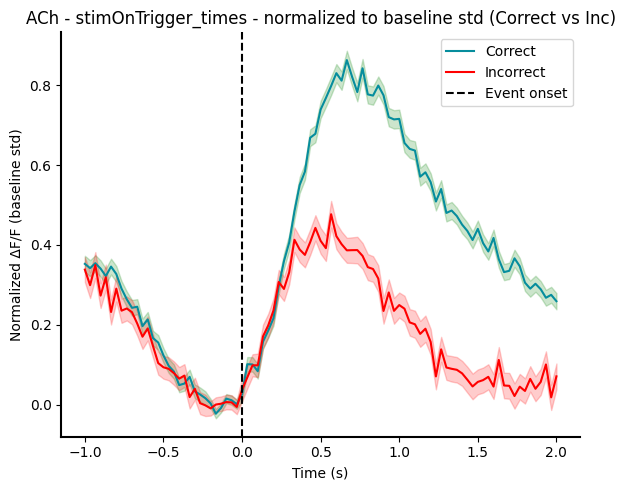

Processing group ACh | Event: feedback_times


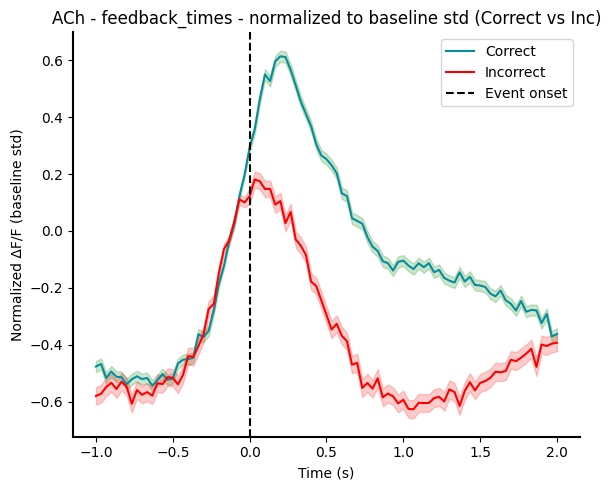

In [26]:
""" PLOT PER NM - 28May2025 """ 
# %%
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    # "VTA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R"],
    # "SNc": ["ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "DR": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "MR": ["ZFM-03062"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    # "LC_L": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06171", "ZFM-06275_L"],
    # "LC_R": ["ZFM-06272_R", "ZFM-06275_R"],
    # "ACh": ["ZFM-06305_L", "ZFM-06305_R", "ZFM-06948"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
    # "SI_R": ["ZFM-06305_R"]
}

def align_and_normalize(psth_subset):
    baseline_value = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
    baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
    aligned_psth = psth_subset - baseline_value
    normalized_psth = aligned_psth / (baseline_std + epsilon)
    return normalized_psth 

def process_and_plot(group_name, trial_mask):
    plt.figure(figsize=(6, 5), dpi=300)
    for contrast in sorted(unique_contrasts):
        contrast_mask = df_trials_combined['allContrasts'].values == contrast
        idx = trial_mask & contrast_mask
        if np.sum(idx) < 5:  # skip very low trial counts
            continue

        psth_subset = psth_combined[idx]
        normalized_psth = align_and_normalize(psth_subset)

        mean_trace = np.mean(normalized_psth, axis=0)
        sem_trace = np.std(normalized_psth, axis=0, ddof=1) / np.sqrt(normalized_psth.shape[0])

        plt.plot(time_vector, mean_trace, label=f"Contrast {contrast:.3f}")
        plt.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, alpha=0.2)

    plt.axvline(0, color='k', linestyle='--', label='Event onset')
    plt.title(f"{group_name.capitalize()} Trials: Normalized PSTHs by Contrast")
    plt.xlabel("Time (s)")
    plt.ylabel("Normalized ΔF/F (baseline std)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


EVENTS = ['stimOnTrigger_times', 'feedback_times'] 
for group_name, group_mice in groups.items():
    for event in EVENTS:
        print(f"Processing group {group_name} | Event: {event}")
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])

        # If PSTH was transposed earlier, fix shape
        if psth_combined.shape[0] == 91:
            psth_combined = psth_combined.T  # Now shape = (n_trials, 91)

        # 1. Time vector and baseline indices
        time_vector = np.linspace(-1, 2, 91)
        baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]

        # 2. Small constant to avoid divide-by-zero
        epsilon = 1e-6

        # 3. Masks for trial types
        correct_mask = df_trials_combined['feedbackType'].values == 1
        incorrect_mask = df_trials_combined['feedbackType'].values == -1

        # 4. Align and normalize function (baseline-std normalization)
        def align_and_normalize(psth_subset):
            # Baseline mean and std per trial
            baseline_value = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
            baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)

            # Align: subtract baseline mean
            aligned_psth = psth_subset - baseline_value

            # Normalize: divide by baseline std
            normalized_psth = aligned_psth / (baseline_std + epsilon)

            # Mean and SEM across trials
            mean_trace = np.mean(normalized_psth, axis=0)
            sem_trace = np.std(normalized_psth, axis=0, ddof=1) / np.sqrt(normalized_psth.shape[0])

            return normalized_psth, mean_trace, sem_trace

        # 5. Apply to correct and incorrect trials
        normalized_psth_c, mean_correct, sem_correct = align_and_normalize(psth_combined[correct_mask])
        normalized_psth_inc, mean_incorrect, sem_incorrect = align_and_normalize(psth_combined[incorrect_mask])

        # 6. Plot both traces
        plt.figure(figsize=(6, 5))

        plt.plot(time_vector, mean_correct, label='Correct', color='#068d9d')
        plt.fill_between(time_vector, mean_correct - sem_correct, mean_correct + sem_correct, color='green', alpha=0.2)

        plt.plot(time_vector, mean_incorrect, label='Incorrect', color='red')
        plt.fill_between(time_vector, mean_incorrect - sem_incorrect, mean_incorrect + sem_incorrect, color='red', alpha=0.2)

        plt.axvline(0, color='k', linestyle='--', label='Event onset')
        plt.xlabel("Time (s)")
        plt.ylabel("Normalized ΔF/F (baseline std)")
        plt.title(f"{group_name} - {event} - normalized to baseline std (Correct vs Inc)")
        plt.legend()
        plt.grid(False)

        # Remove top/right spines; bold bottom/left
        ax = plt.gca()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        # Set black color and bold lines for left/bottom
        ax.spines['left'].set_color('black')
        ax.spines['left'].set_linewidth(1.5)
        ax.spines['bottom'].set_color('black')
        ax.spines['bottom'].set_linewidth(1.5)
        # plt.ylim(-1.5,3.5)
        plt.tight_layout()
        filename = f"psth_corr_inc_{group_name}_{event}".replace(" ", "_")
        plt.savefig(f"/mnt/h0/kb/code_kcenia/stats/{filename}.png", dpi=300, bbox_inches='tight')
        plt.savefig(f"/mnt/h0/kb/code_kcenia/stats/{filename}.pdf", dpi=300, bbox_inches='tight')
        plt.show()


Processing group DA | Event: stimOnTrigger_times


/tmp/ipykernel_2442464/1361470235.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


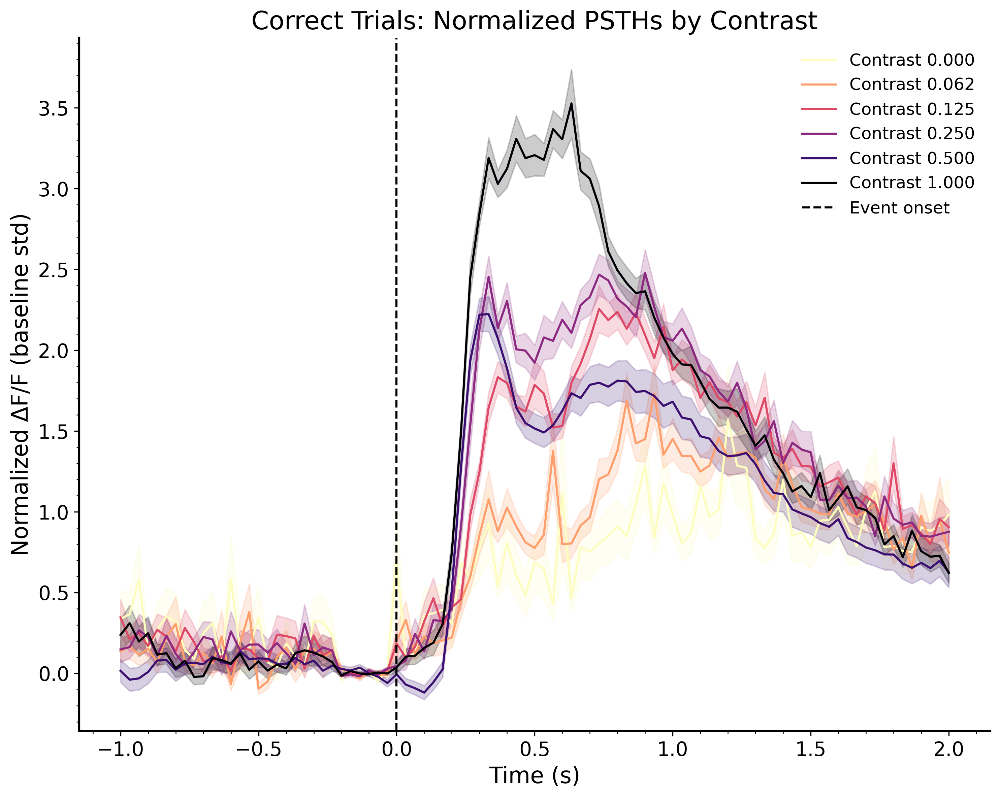

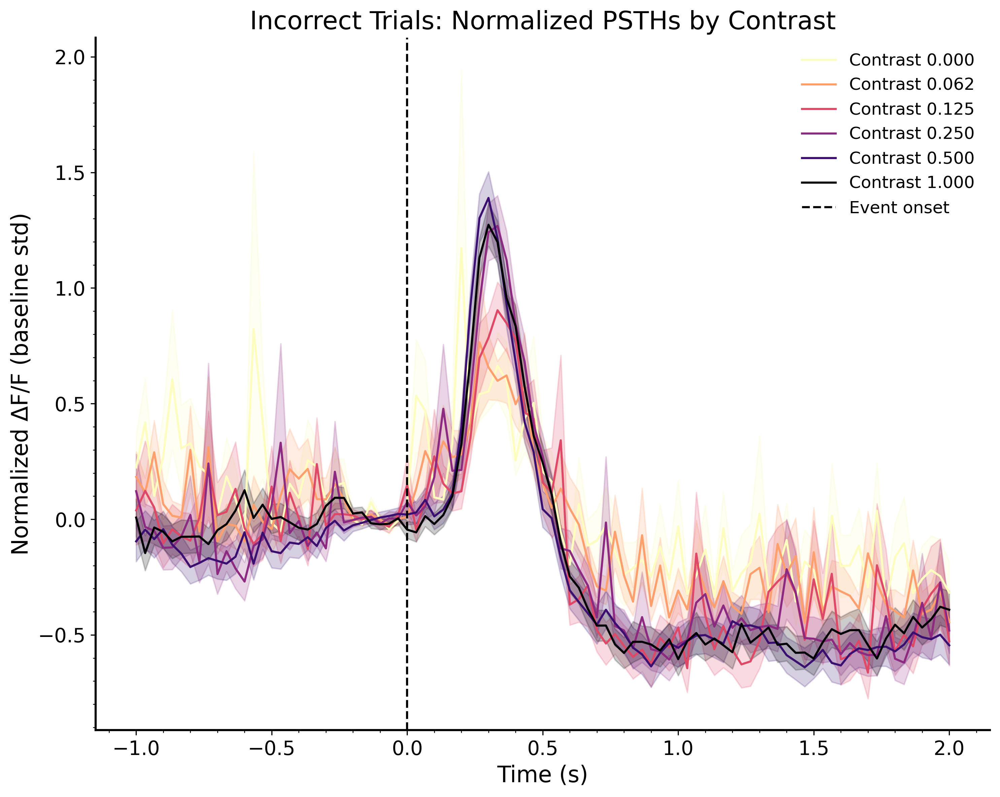

In [ ]:
""" PERFECT BY CONTRASTS """

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

# Load data
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"]
}
EVENTS = ['stimOnTrigger_times']
for group_name, group_mice in groups.items():
    for event in EVENTS:
        print(f"Processing group {group_name} | Event: {event}")
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])

# Transpose if needed
if psth_combined.shape[0] == 91:
    psth_combined = psth_combined.T  # shape = (n_trials, 91)

# Time vector and baseline window
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
epsilon = 1e-6

# Trial masks
trial_groups = {
    "Correct": df_trials_combined['feedbackType'].values == 1,
    "Incorrect": df_trials_combined['feedbackType'].values == -1
}

# Contrast levels
unique_contrasts = np.sort(np.unique(df_trials_combined['allContrasts'].values))
cmap = get_cmap('magma_r')
colors = cmap(np.linspace(0, 1, len(unique_contrasts)))  # Get N colors

# Normalization function
def align_and_normalize(psth_subset):
    baseline_value = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
    baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
    aligned_psth = psth_subset - baseline_value
    normalized_psth = aligned_psth / (baseline_std + epsilon)
    return normalized_psth

# Plot loop
for group_name, group_mask in trial_groups.items():
    plt.figure(figsize=(10, 8), dpi=300)
    
    for i, contrast in enumerate(unique_contrasts):
        contrast_mask = df_trials_combined['allContrasts'].values == contrast
        idx = group_mask & contrast_mask
        if np.sum(idx) < 5:
            continue

        psth_subset = psth_combined[idx]
        normalized_psth = align_and_normalize(psth_subset)

        mean_trace = np.mean(normalized_psth, axis=0)
        sem_trace = np.std(normalized_psth, axis=0, ddof=1) / np.sqrt(normalized_psth.shape[0])

        color = colors[i]
        plt.plot(time_vector, mean_trace, label=f"Contrast {contrast:.3f}", color=color, linewidth=1.5)
        plt.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, color=color, alpha=0.2)

    plt.axvline(0, color='k', linestyle='--', label='Event onset')

    # Aesthetics
    plt.title(f"{group_name} Trials: Normalized PSTHs by Contrast", fontsize=18)
    plt.xlabel("Time (s)", fontsize=16)
    plt.ylabel("Normalized ΔF/F (baseline std)", fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.minorticks_on()

    # Remove top/right spines; bold bottom/left
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Set black color and bold lines for left/bottom
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_color('black')
    ax.spines['bottom'].set_linewidth(1.5)


    for i, contrast in enumerate(unique_contrasts):
    # Legend styling
    plt.legend(fontsize=12, frameon=False)

    # plt.grid(True, which='both', linestyle=':', linewidth=0.5) 
    plt.grid(False) 
    plt.tight_layout()
    plt.show()




Processing group DA | Event: stimOnTrigger_times


/tmp/ipykernel_2442464/1659356968.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


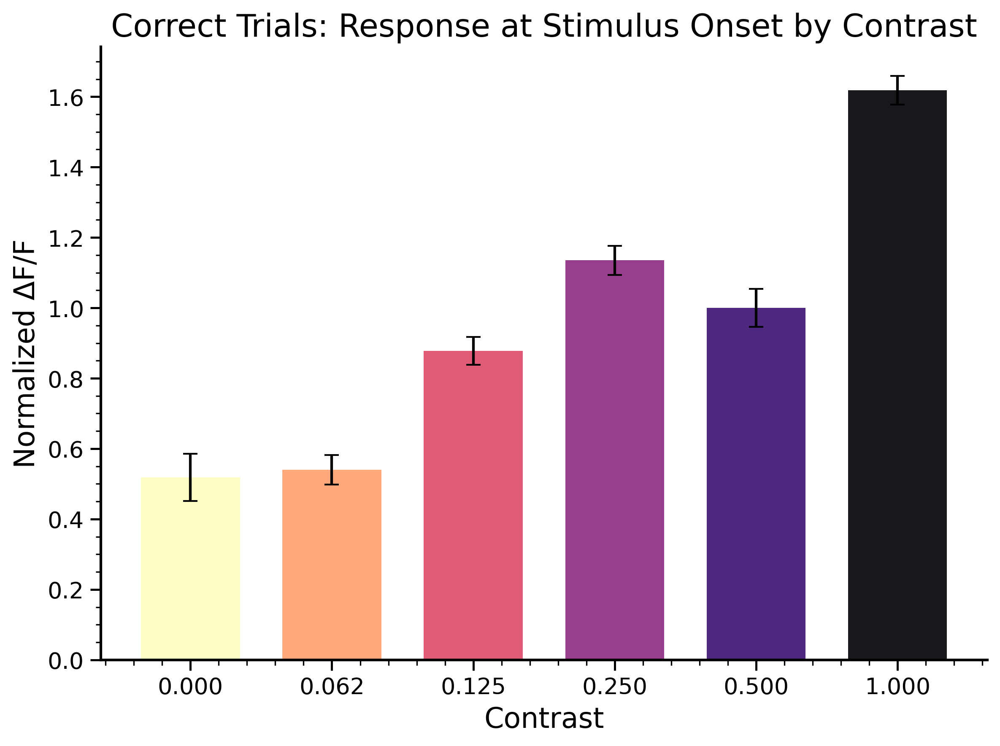

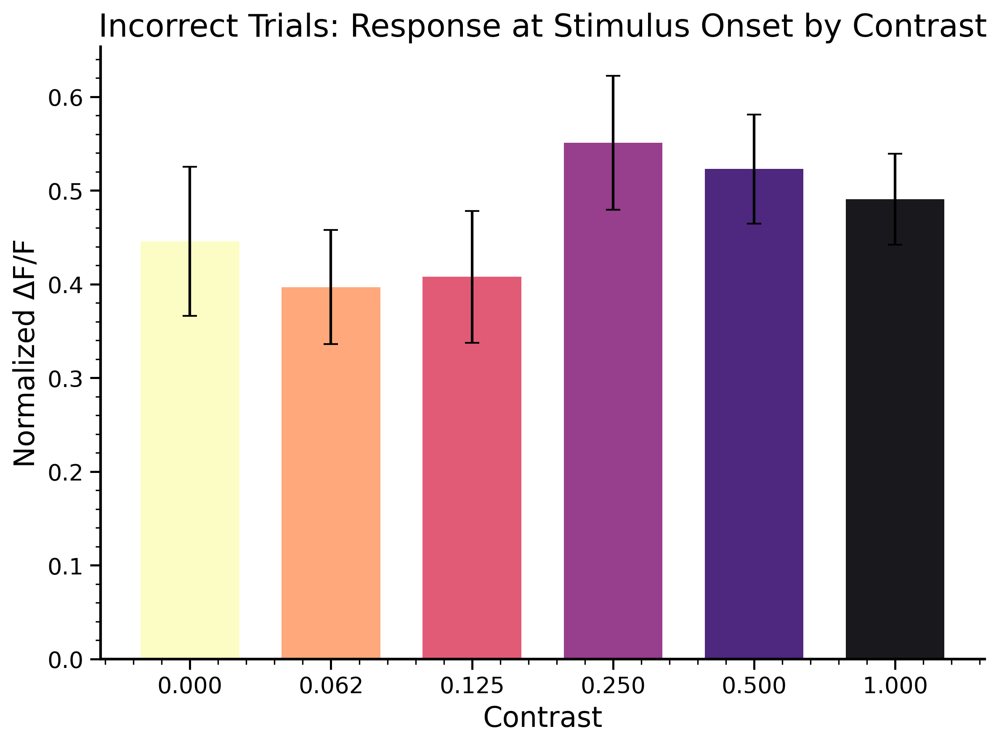

In [12]:
""" PERFECT BY CONTRASTS """
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

# Load data
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"]
}
EVENTS = ['stimOnTrigger_times']
for group_name, group_mice in groups.items():
    for event in EVENTS:
        print(f"Processing group {group_name} | Event: {event}")
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])

# Transpose if needed
if psth_combined.shape[0] == 91:
    psth_combined = psth_combined.T  # shape = (n_trials, 91)

# Time vector and baseline window
time_vector = np.linspace(-1, 2, 91)
epsilon = 1e-6


# Define baseline and response windows
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]

# Colormap
cmap = get_cmap('magma_r')
colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

# Trial group masks
trial_groups = {
    "Correct": df_trials_combined['feedbackType'].values == 1,
    "Incorrect": df_trials_combined['feedbackType'].values == -1
}

# Loop through correct/incorrect groups
for group_name, group_mask in trial_groups.items():
    # Reset storage
    response_means = []
    response_sems = []
    contrast_labels = []
    bar_colors = []

    for i, contrast in enumerate(unique_contrasts):
        contrast_mask = df_trials_combined['allContrasts'].values == contrast
        idx = group_mask & contrast_mask
        if np.sum(idx) < 5:
            continue

        psth_subset = psth_combined[idx]
        normalized_psth = align_and_normalize(psth_subset)

        response_vals = np.mean(normalized_psth[:, response_idx], axis=1)

        response_means.append(np.mean(response_vals))
        response_sems.append(np.std(response_vals, ddof=1) / np.sqrt(len(response_vals)))
        contrast_labels.append(f"{contrast:.3f}")
        bar_colors.append(colors[i])

    # Plot bar plot for current group
    x = np.arange(len(contrast_labels))
    bar_width = 0.7

    fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

    for i in range(len(x)):
        ax.bar(x[i], response_means[i], width=bar_width, yerr=response_sems[i],
               color=bar_colors[i], alpha=0.9, capsize=4)

    ax.set_xticks(x)
    ax.set_xticklabels(contrast_labels, fontsize=14)
    ax.set_xlabel("Contrast", fontsize=16)
    ax.set_ylabel("Normalized ΔF/F", fontsize=16)
    ax.set_title(f"{group_name} Trials: Response at Stimulus Onset by Contrast", fontsize=18)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_color('black')
    ax.spines['bottom'].set_linewidth(1.5)

    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
    ax.tick_params(axis='both', which='minor', direction='out', length=3, width=0.8)
    ax.minorticks_on()

    plt.grid(False)
    plt.tight_layout()
    plt.show()



In [15]:
def extract_normalized_response(df_trials, psth_data, contrast_list, feedback_code, time_vector, response_idx, baseline_idx, epsilon=1e-6):
    result = []
    for contrast in contrast_list:
        idx = (df_trials['feedbackType'].values == feedback_code) & (df_trials['allContrasts'].values == contrast)
        if np.sum(idx) < 5:
            continue
        psth_subset = psth_data[idx]
        baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        aligned = psth_subset - baseline
        normalized = aligned / (baseline_std + epsilon)
        response_vals = np.mean(normalized[:, response_idx], axis=1)
        for v in response_vals:
            result.append({'value': v, 'contrast': contrast, 'feedbackType': feedback_code})
    return pd.DataFrame(result)





df_anova = extract_normalized_response(df_trials_combined, psth_combined, unique_contrasts, 1, time_vector, response_idx, baseline_idx)




import pingouin as pg
aov = pg.anova(data=df_anova, dv='value', between='contrast', detailed=True)
posthoc = pg.pairwise_tukey(data=df_anova, dv='value', between='contrast')









/tmp/ipykernel_2442464/641909280.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


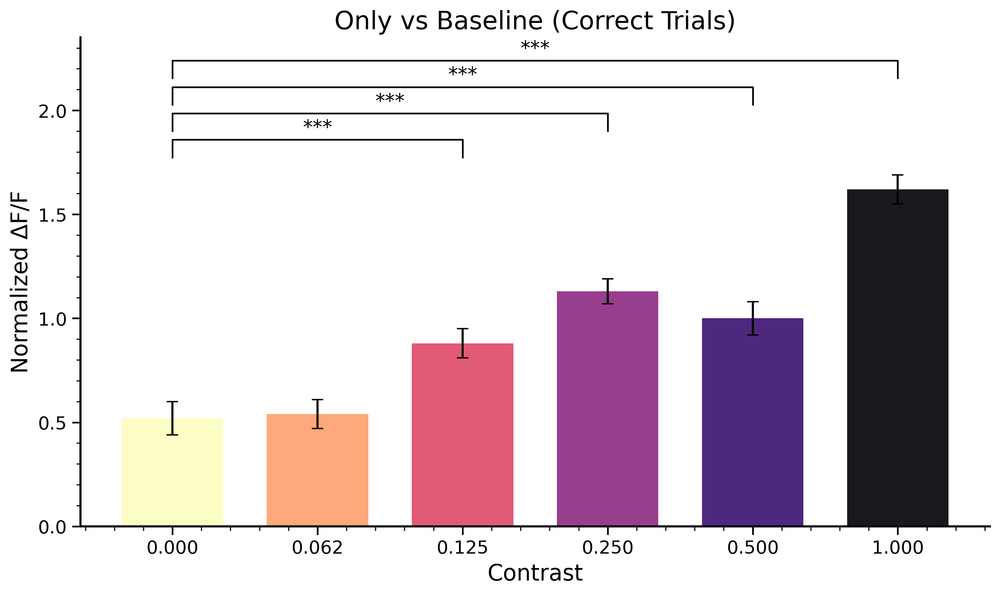

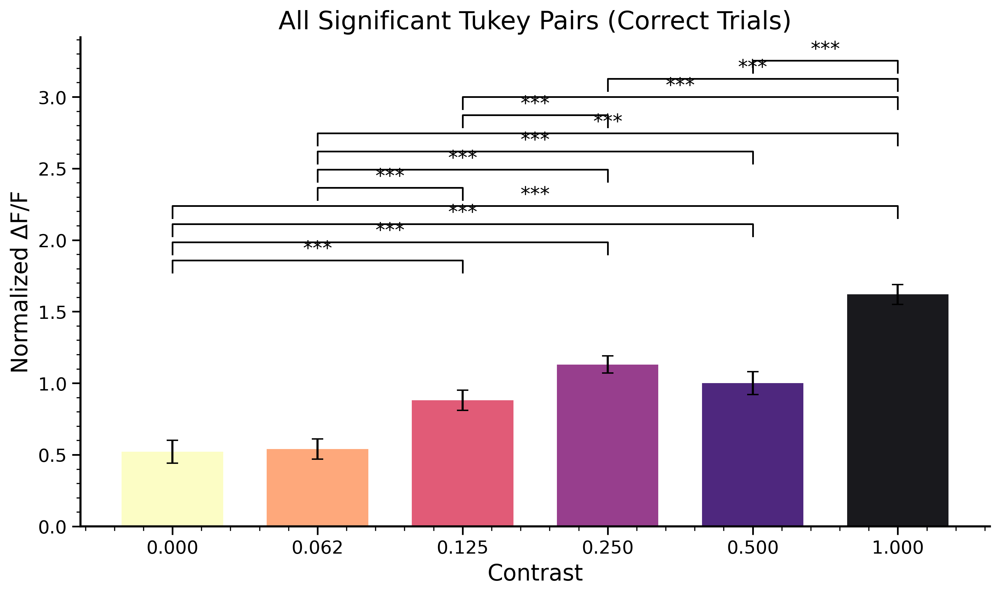

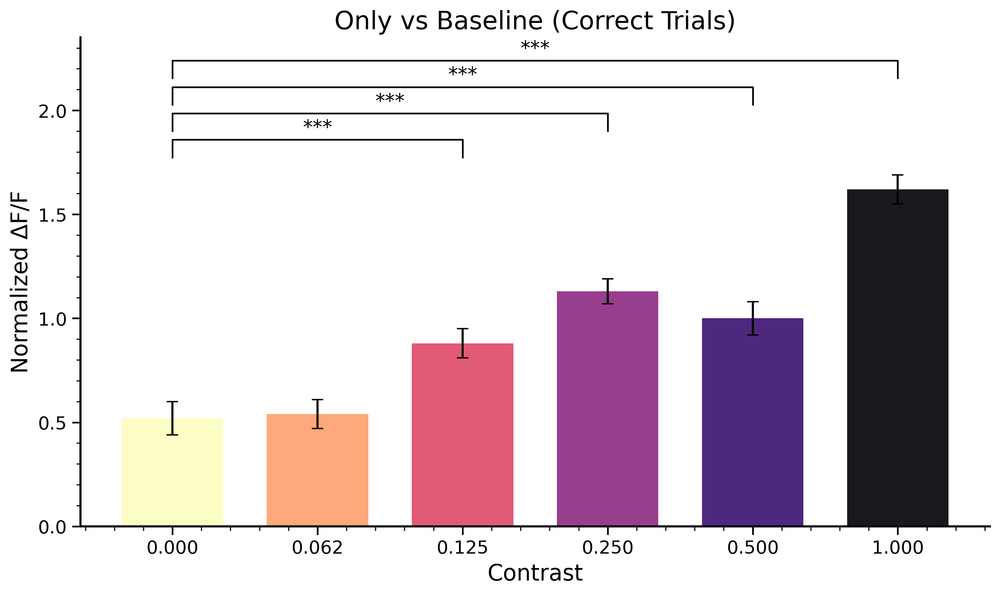

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

# Replace these with your real data
contrast_labels = ['0.000', '0.062', '0.125', '0.250', '0.500', '1.000']
means = np.array([0.52, 0.54, 0.88, 1.13, 1.00, 1.62])
sems = np.array([0.08, 0.07, 0.07, 0.06, 0.08, 0.07])
x = np.arange(len(contrast_labels))
bar_width = 0.7
cmap = get_cmap('magma_r')
colors = cmap(np.linspace(0, 1, len(contrast_labels)))

# All significant Tukey pairs (A, B, p-value)
significant_pairs_all = [
    ('0.000', '0.125', 4.08e-05),
    ('0.000', '0.250', 1.91e-12),
    ('0.000', '0.500', 8.03e-07),
    ('0.000', '1.000', 1.91e-12),
    ('0.062', '0.125', 9.31e-06),
    ('0.062', '0.250', 1.91e-12),
    ('0.062', '0.500', 2.02e-07),
    ('0.062', '1.000', 1.91e-12),
    ('0.125', '0.250', 3.60e-04),
    ('0.125', '1.000', 1.91e-12),
    ('0.250', '1.000', 1.91e-12),
    ('0.500', '1.000', 1.91e-12)
]

# Option 2: only comparisons vs 0.000 contrast
significant_pairs_vs_baseline = [p for p in significant_pairs_all if p[0] == '0.000']

# Helper to assign stars
def p_to_stars(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# Plotting function
def plot_with_significance(pairs, title):
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
    
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    y_max = np.max(means + sems)
    y_offset = y_max * 0.05
    current_y = y_max + y_offset

    label_to_x = {label: xi for label, xi in zip(contrast_labels, x)}

    for c1, c2, p_val in pairs:
        i1, i2 = label_to_x[c1], label_to_x[c2]
        x1, x2 = min(i1, i2), max(i1, i2)
        ax.plot([x1, x1, x2, x2], [current_y, current_y + y_offset, current_y + y_offset, current_y],
                lw=1.2, c='black')
        ax.text((x1 + x2) / 2, current_y + y_offset + 0.01, p_to_stars(p_val),
                ha='center', va='bottom', fontsize=14)
        current_y += y_offset * 1.5

    # Aesthetics
    ax.set_xticks(x)
    ax.set_xticklabels(contrast_labels, fontsize=14)
    ax.set_xlabel("Contrast", fontsize=16)
    ax.set_ylabel("Normalized ΔF/F", fontsize=16)
    ax.set_title(title, fontsize=18)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_color('black')
    ax.spines['bottom'].set_linewidth(1.5)

    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
    ax.tick_params(axis='both', which='minor', direction='out', length=3, width=0.8)
    ax.minorticks_on()
    ax.grid(False)
    plt.tight_layout()
    return fig

# Generate both versions
plot_with_significance(significant_pairs_all, "All Significant Tukey Pairs (Correct Trials)")
plot_with_significance(significant_pairs_vs_baseline, "Only vs Baseline (Correct Trials)")


/tmp/ipykernel_1055368/3626325747.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


/tmp/ipykernel_1055368/3576315233.py:59: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


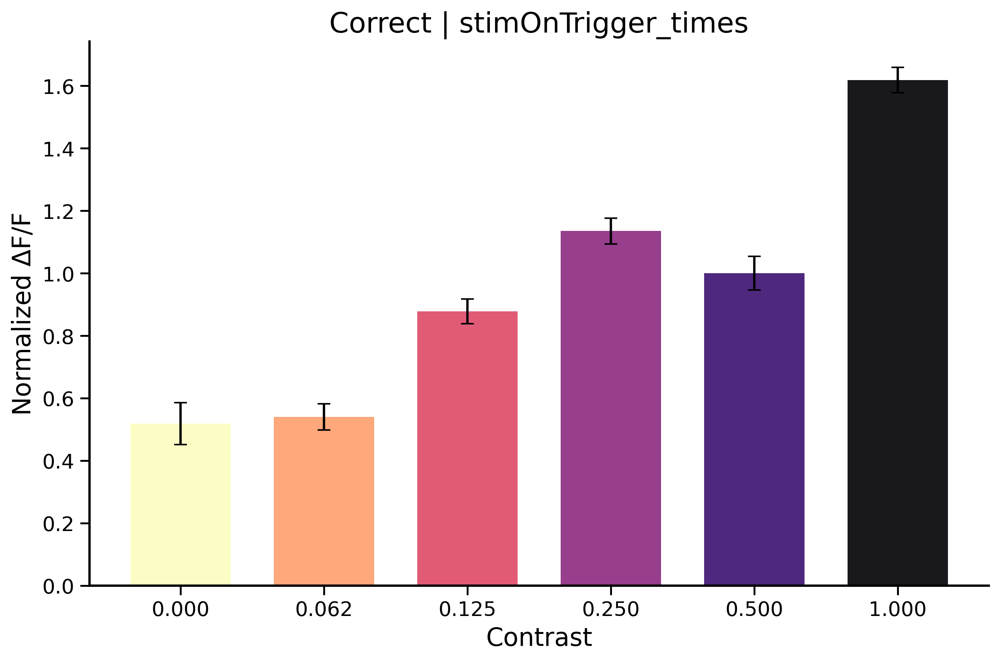


=== Correct | stimOnTrigger_times ===
ANOVA:
     Source             SS     DF          MS          F         p-unc  \
0  contrast    4155.199338      5  831.039868  91.014663  2.851008e-95   
1    Within  233338.488442  25555    9.130835        NaN           NaN   

        np2  
0  0.017496  
1       NaN  

Tukey post-hoc:
         A       B      diff       p-tukey
0   0.0000  0.0625 -0.021509  9.998047e-01
1   0.0000  0.1250 -0.359402  4.081390e-05
2   0.0000  0.2500 -0.616702  1.917022e-12
3   0.0000  0.5000 -0.482042  8.039379e-07
4   0.0000  1.0000 -1.100157  1.916134e-12
5   0.0625  0.1250 -0.337892  9.313116e-06
6   0.0625  0.2500 -0.595192  1.916134e-12
7   0.0625  0.5000 -0.460533  2.026341e-07
8   0.0625  1.0000 -1.078648  1.916134e-12
9   0.1250  0.2500 -0.257300  3.597422e-04
10  0.1250  0.5000 -0.122640  6.211885e-01
11  0.1250  1.0000 -0.740756  1.916134e-12
12  0.2500  0.5000  0.134659  4.764585e-01
13  0.2500  1.0000 -0.483456  1.916134e-12
14  0.5000  1.0000 -0.61811

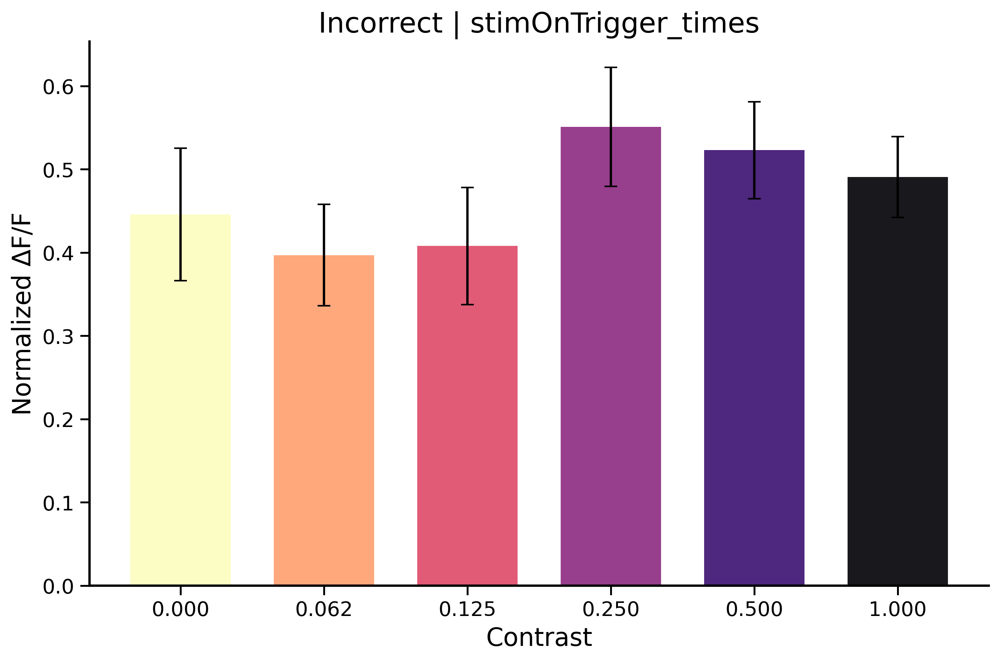


=== Incorrect | stimOnTrigger_times ===
ANOVA:
     Source            SS     DF        MS         F     p-unc       np2
0  contrast     30.300852      5  6.060170  0.811642  0.541097  0.000401
1    Within  75583.979247  10123  7.466559       NaN       NaN       NaN

Tukey post-hoc:
         A       B      diff   p-tukey
0   0.0000  0.0625  0.048774  0.992640
1   0.0000  0.1250  0.037907  0.998693
2   0.0000  0.2500 -0.105082  0.900825
3   0.0000  0.5000 -0.077175  0.961138
4   0.0000  1.0000 -0.045030  0.995777
5   0.0625  0.1250 -0.010867  0.999997
6   0.0625  0.2500 -0.153857  0.628701
7   0.0625  0.5000 -0.125949  0.739302
8   0.0625  1.0000 -0.093805  0.889641
9   0.1250  0.2500 -0.142989  0.769953
10  0.1250  0.5000 -0.115082  0.863539
11  0.1250  1.0000 -0.082937  0.956443
12  0.2500  0.5000  0.027907  0.999827
13  0.2500  1.0000  0.060052  0.991758
14  0.5000  1.0000  0.032145  0.999399


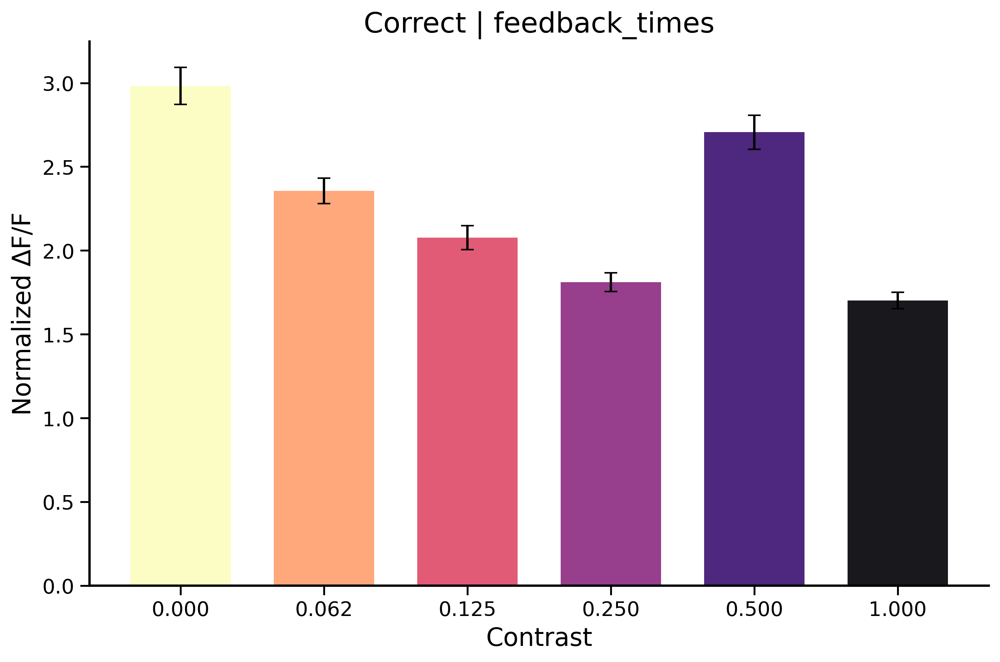


=== Correct | feedback_times ===
ANOVA:
     Source             SS     DF          MS          F         p-unc  \
0  contrast    4569.336323      5  913.867265  44.916838  2.496015e-46   
1    Within  519935.932374  25555   20.345761        NaN           NaN   

        np2  
0  0.008712  
1       NaN  

Tukey post-hoc:
         A       B      diff       p-tukey
0   0.0000  0.0625  0.625219  2.044742e-06
1   0.0000  0.1250  0.905529  1.955547e-12
2   0.0000  0.2500  1.171490  1.916134e-12
3   0.0000  0.5000  0.275520  2.962294e-01
4   0.0000  1.0000  1.280616  1.916134e-12
5   0.0625  0.1250  0.280310  6.244297e-02
6   0.0625  0.2500  0.546271  2.140049e-07
7   0.0625  0.5000 -0.349699  4.464397e-02
8   0.0625  1.0000  0.655397  1.444511e-11
9   0.1250  0.2500  0.265962  4.102546e-02
10  0.1250  0.5000 -0.630009  1.067433e-06
11  0.1250  1.0000  0.375087  1.905275e-04
12  0.2500  0.5000 -0.895970  1.945444e-12
13  0.2500  1.0000  0.109125  7.511034e-01
14  0.5000  1.0000  1.005096  1.

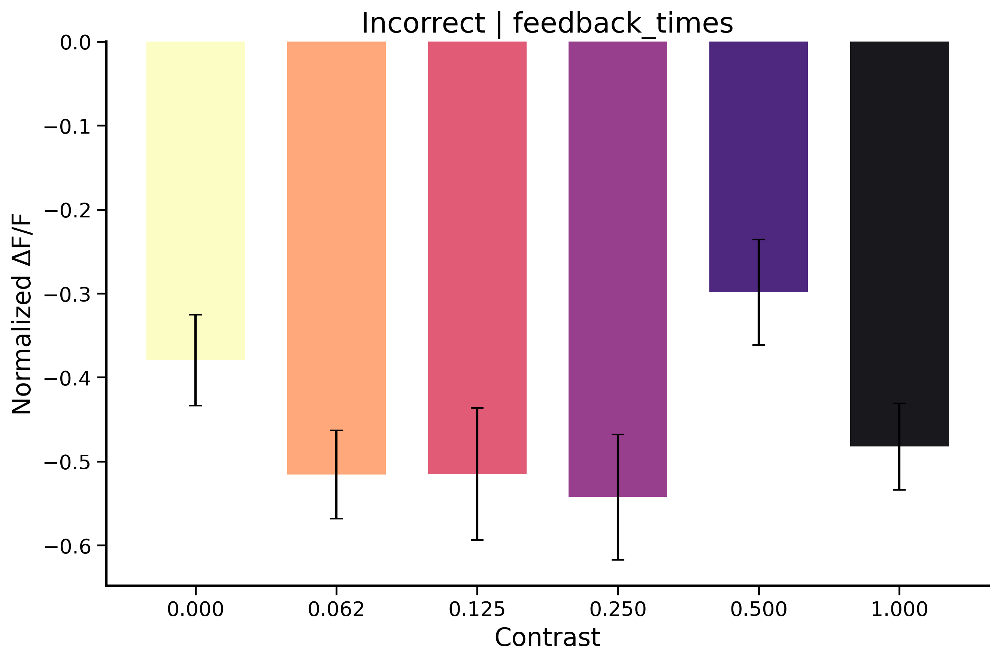


=== Incorrect | feedback_times ===
ANOVA:
     Source            SS     DF         MS         F     p-unc       np2
0  contrast     72.556875      5  14.511375  2.334567  0.039634  0.001152
1    Within  62923.305065  10123   6.215875       NaN       NaN       NaN

Tukey post-hoc:
         A       B      diff   p-tukey
0   0.0000  0.0625  0.136301  0.490603
1   0.0000  0.1250  0.135655  0.620282
2   0.0000  0.2500  0.163195  0.474037
3   0.0000  0.5000 -0.080779  0.931209
4   0.0000  1.0000  0.102968  0.795895
5   0.0625  0.1250 -0.000646  1.000000
6   0.0625  0.2500  0.026894  0.999688
7   0.0625  0.5000 -0.217081  0.095729
8   0.0625  1.0000 -0.033333  0.998330
9   0.1250  0.2500  0.027540  0.999769
10  0.1250  0.5000 -0.216434  0.172398
11  0.1250  1.0000 -0.032687  0.999096
12  0.2500  0.5000 -0.243974  0.115175
13  0.2500  1.0000 -0.060227  0.987283
14  0.5000  1.0000  0.183747  0.270180


In [ ]:
# %%
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

# Replace these with your real data
contrast_labels = ['0.000', '0.062', '0.125', '0.250', '0.500', '1.000']
means = np.array([0.52, 0.54, 0.88, 1.13, 1.00, 1.62])
sems = np.array([0.08, 0.07, 0.07, 0.06, 0.08, 0.07])
x = np.arange(len(contrast_labels))
bar_width = 0.7
cmap = get_cmap('magma_r')
colors = cmap(np.linspace(0, 1, len(contrast_labels)))

# All significant Tukey pairs (A, B, p-value)
significant_pairs_all = [
    ('0.000', '0.125', 4.08e-05),
    ('0.000', '0.250', 1.91e-12),
    ('0.000', '0.500', 8.03e-07),
    ('0.000', '1.000', 1.91e-12),
    ('0.062', '0.125', 9.31e-06),
    ('0.062', '0.250', 1.91e-12),
    ('0.062', '0.500', 2.02e-07),
    ('0.062', '1.000', 1.91e-12),
    ('0.125', '0.250', 3.60e-04),
    ('0.125', '1.000', 1.91e-12),
    ('0.250', '1.000', 1.91e-12),
    ('0.500', '1.000', 1.91e-12)
]

# Option 2: only comparisons vs 0.000 contrast
significant_pairs_vs_baseline = [p for p in significant_pairs_all if p[0] == '0.000']

# Helper to assign stars
def p_to_stars(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# Plotting function
def plot_with_significance(pairs, title, filename):
    fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
    
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    y_max = np.max(means + sems)
    y_offset = y_max * 0.05
    current_y = y_max + y_offset

    label_to_x = {label: xi for label, xi in zip(contrast_labels, x)}

    for c1, c2, p_val in pairs:
        i1, i2 = label_to_x[c1], label_to_x[c2]
        x1, x2 = min(i1, i2), max(i1, i2)
        # ax.plot([x1, x1, x2, x2], [current_y, current_y + y_offset, current_y + y_offset, current_y],
        #         lw=1.2, c='black')


        # cleaner with shorter leg height
        leg_height = y_offset * 0.8
        ax.plot([x1, x1, x2, x2], [current_y, current_y + leg_height, current_y + leg_height, current_y], lw=1.2, c='black')

        ax.text((x1 + x2) / 2, current_y + y_offset * 0.5, p_to_stars(p_val),
                ha='center', va='bottom', fontsize=14)
        current_y += y_offset * 1.1

    # Aesthetics
    ax.set_xticks(x)
    ax.set_xticklabels(contrast_labels, fontsize=14)
    ax.set_xlabel("Contrast", fontsize=16)
    ax.set_ylabel("Normalized ΔF/F", fontsize=16)
    ax.set_title(title, fontsize=18)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_color('black')
    ax.spines['bottom'].set_linewidth(1.5)

    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
    # ax.tick_params(axis='both', which='minor', direction='out', length=3, width=0.8)
    # ax.minorticks_on()
    ax.grid(False)
    plt.tight_layout()
    # SAVE FIGURE
    fig.savefig(f"/media/ibladmin/backup/kb/code_kcenia/stats/{filename}.png", dpi=300, bbox_inches='tight')
    fig.savefig(f"/media/ibladmin/backup/kb/code_kcenia/stats/{filename}.pdf", dpi=300, bbox_inches='tight')
    plt.close(fig)  # Prevent duplicate display if looping
    # return fig

## Generate both versions
# plot_with_significance(significant_pairs_all, "All Significant Tukey Pairs (Correct Trials)")
## plot_with_significance(significant_pairs_vs_baseline, "Only vs Baseline (Correct Trials)")









# %%
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from pingouin import pairwise_tukey
import pingouin as pg

# Normalization function per group
def extract_normalized_response(df_trials, psth_data, contrast_list, feedback_code, time_vector, response_idx, baseline_idx, epsilon=1e-6):
    result = []
    for contrast in contrast_list:
        idx = (df_trials['feedbackType'].values == feedback_code) & (df_trials['allContrasts'].values == contrast)
        if np.sum(idx) < 5:
            continue
        psth_subset = psth_data[idx]
        baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        aligned = psth_subset - baseline
        normalized = aligned / (baseline_std + epsilon)
        response_vals = np.mean(normalized[:, response_idx], axis=1)
        for v in response_vals:
            result.append({'value': v, 'contrast': contrast, 'feedbackType': 'Correct' if feedback_code == 1 else 'Incorrect'})
    return pd.DataFrame(result)

# Main plot function
def plot_response_by_contrast(df, title, colors):
    contrast_levels = np.sort(df['contrast'].unique())
    means = df.groupby('contrast')['value'].mean()
    sems = df.groupby('contrast')['value'].sem()

    x = np.arange(len(contrast_levels))
    fig, ax = plt.subplots(figsize=(9, 6), dpi=300)
    for i, c in enumerate(contrast_levels):
        ax.bar(x[i], means.loc[c], width=0.7, yerr=sems.loc[c], color=colors[i], alpha=0.9, capsize=4)

    ax.set_xticks(x)
    ax.set_xticklabels([f"{c:.3f}" for c in contrast_levels], fontsize=14)
    ax.set_xlabel("Contrast", fontsize=16)
    ax.set_ylabel("Normalized ΔF/F", fontsize=16)
    ax.set_title(title, fontsize=18)
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines['left'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
    # ax.tick_params(axis='both', which='minor', direction='out', length=3, width=0.8)
    # ax.minorticks_on()
    ax.grid(False)
    # plt.ylim(-0.7,3)
    plt.tight_layout()
    plt.show()

# Setup parameters
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
cmap = get_cmap('magma_r')

# Loop through both events and both feedback types
events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

for event in events:
    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        if psth_combined.shape[0] == 91:
            psth_combined = psth_combined.T
        unique_contrasts = np.sort(np.unique(df_trials_combined['allContrasts'].values))
        colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

        for fb_label, fb_code in feedback_types.items():
            df_plot = extract_normalized_response(df_trials_combined, psth_combined, unique_contrasts,
                                                  feedback_code=fb_code,
                                                  time_vector=time_vector,
                                                  response_idx=response_idx,
                                                  baseline_idx=baseline_idx)
            

            # Means and SEMs needed for plotting
            contrast_labels = [f"{c:.3f}" for c in unique_contrasts]
            means = df_plot.groupby('contrast')['value'].mean().reindex(unique_contrasts).values
            sems = df_plot.groupby('contrast')['value'].sem().reindex(unique_contrasts).values
            x = np.arange(len(contrast_labels))

            # Build significant pairs for plotting
            significant_pairs_all = [
                (f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey'])
                for _, row in posthoc.iterrows() if row['p-tukey'] < 0.05
            ]

            # Save plot
            filename = f"barplot_{event}_{fb_label}".replace(" ", "_")
            plot_with_significance(significant_pairs_all, title=f"{fb_label} | {event}", filename=filename)






            print(f"\n=== {fb_label} | {event} ===")
            aov = pg.anova(data=df_plot, dv='value', between='contrast', detailed=True)
            print("ANOVA:")
            print(aov)

            posthoc = pg.pairwise_tukey(data=df_plot, dv='value', between='contrast')
            print("\nTukey post-hoc:")
            print(posthoc[['A', 'B', 'diff', 'p-tukey']])
            # Build significant pairs for plotting
            significant_pairs_all = [
                (f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey'])
                for _, row in posthoc.iterrows() if row['p-tukey'] < 0.05
            ]

            # Then call
            filename = f"barplot_{event}_{fb_label}".replace(" ", "_")
            plot_with_significance(significant_pairs_all, title=f"{fb_label} | {event}", filename=filename)
            





/tmp/ipykernel_2442464/885441055.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


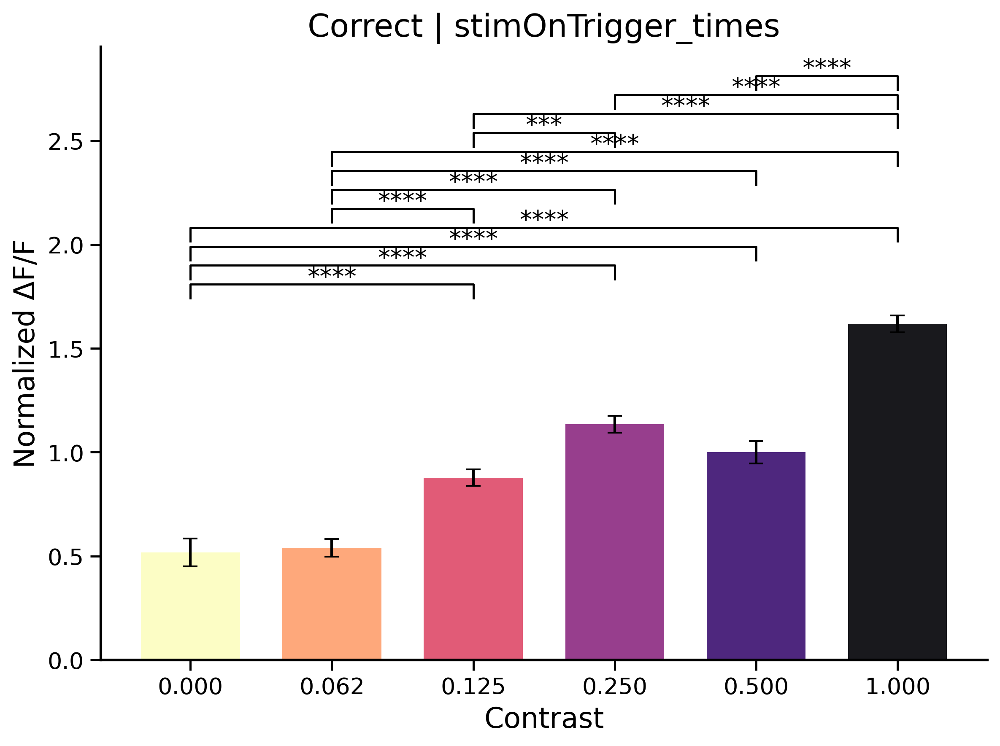

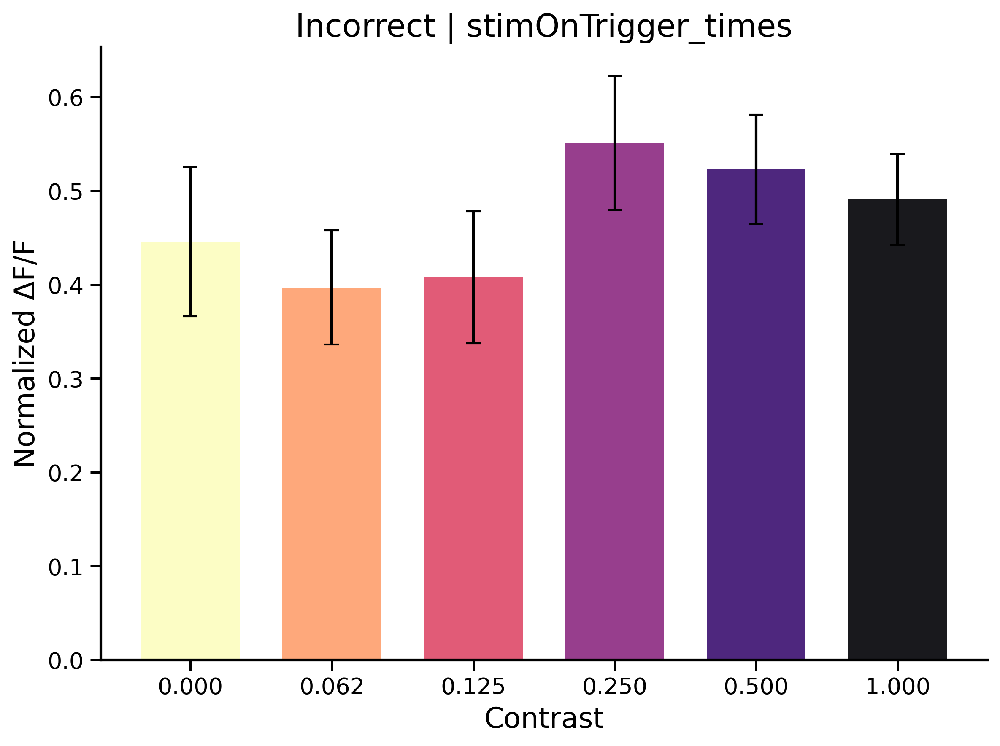

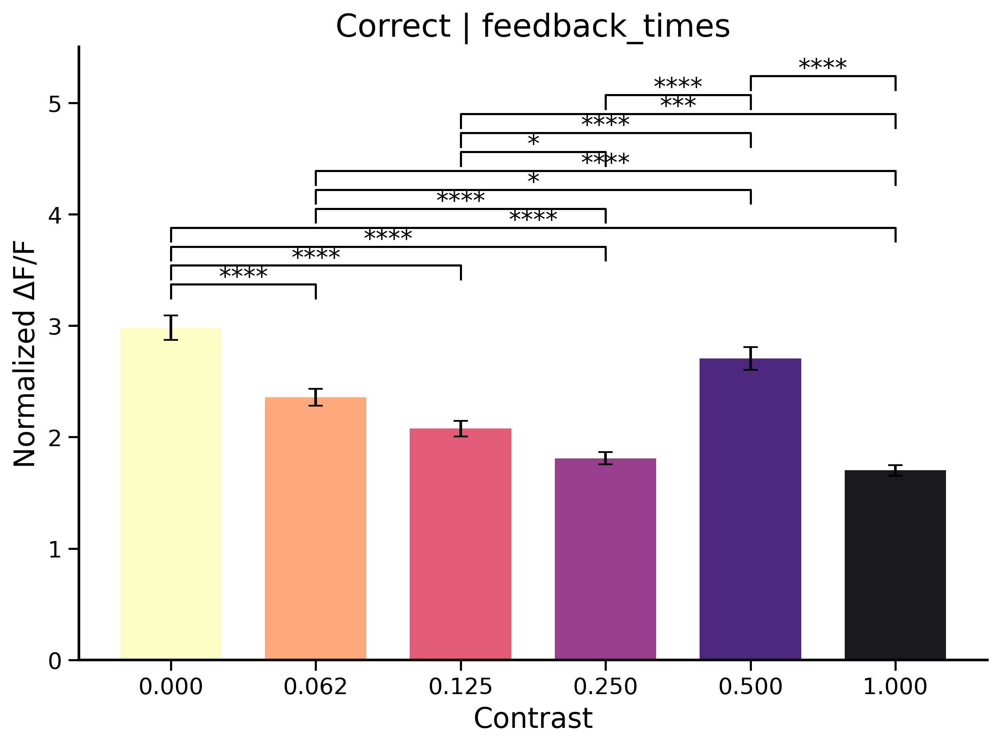

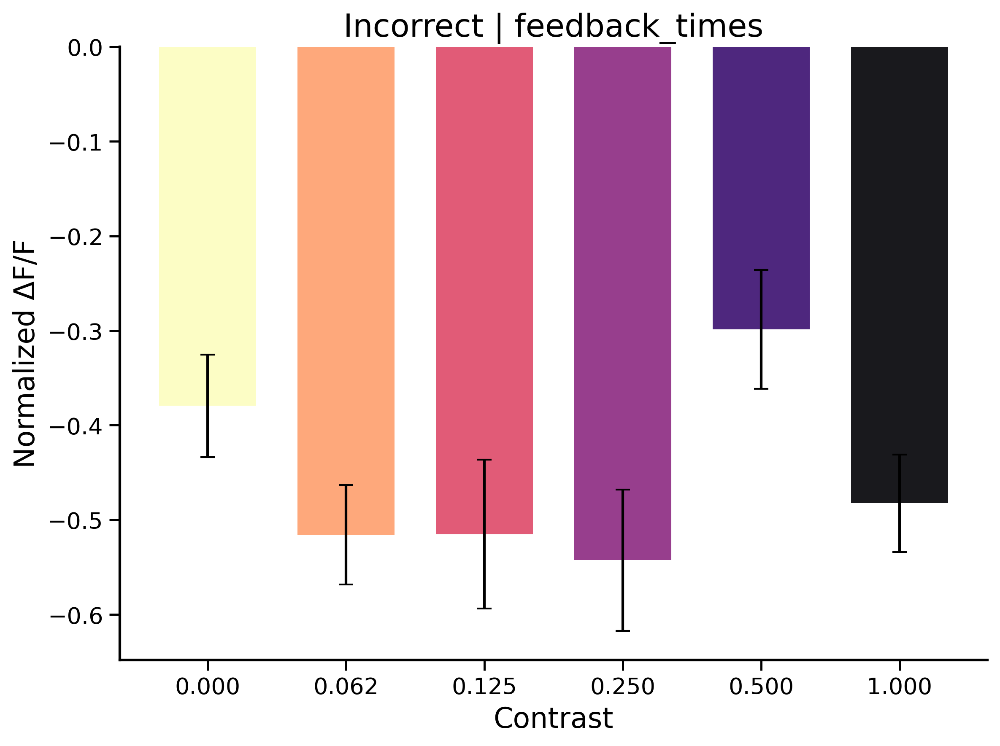

In [ ]:
# %%
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from pingouin import pairwise_tukey
import pingouin as pg

# ============================
# Helper: Stars from p-values
# ============================
def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# ============================
# Helper: Plot barplot + stars
# ============================
def plot_with_significance(pairs, title, filename, contrast_labels, means, sems, colors):
    x = np.arange(len(contrast_labels))
    bar_width = 0.7

    fig, ax = plt.subplots(figsize=(8, 6), dpi=300)
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    y_max = np.max(means + sems)
    y_offset = y_max * 0.05
    current_y = y_max + y_offset

    label_to_x = {label: xi for label, xi in zip(contrast_labels, x)}

    for c1, c2, p_val in pairs:
        i1, i2 = label_to_x[c1], label_to_x[c2]
        x1, x2 = min(i1, i2), max(i1, i2)
        leg_height = y_offset * 0.8
        ax.plot([x1, x1, x2, x2], [current_y, current_y + leg_height, current_y + leg_height, current_y], lw=1.2, c='black')
        ax.text((x1 + x2) / 2, current_y + y_offset * 0.5, p_to_stars(p_val), ha='center', va='bottom', fontsize=14)
        current_y += y_offset * 1.1

    ax.set_xticks(x)
    ax.set_xticklabels(contrast_labels, fontsize=14)
    ax.set_xlabel("Contrast", fontsize=16)
    ax.set_ylabel("Normalized ΔF/F", fontsize=16)
    ax.set_title(title, fontsize=18)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
    ax.grid(False)
    plt.tight_layout()
    """ TO SAVE """
    # fig.savefig(f"/mnt/h0/kb/code_kcenia/stats/{filename}.png", dpi=300, bbox_inches='tight')
    # fig.savefig(f"/mnt/h0/kb/code_kcenia/stats/{filename}.pdf", dpi=300, bbox_inches='tight')
    # plt.show()

# ============================
# Data extraction + normalization
# ============================
def extract_normalized_response(df_trials, psth_data, contrast_list, feedback_code, time_vector, response_idx, baseline_idx, epsilon=1e-6):
    result = []
    for contrast in contrast_list:
        idx = (df_trials['feedbackType'].values == feedback_code) & (df_trials['allContrasts'].values == contrast)
        if np.sum(idx) < 5:
            continue
        psth_subset = psth_data[idx]
        baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        aligned = psth_subset - baseline
        normalized = aligned / (baseline_std + epsilon)
        response_vals = np.mean(normalized[:, response_idx], axis=1)
        for v in response_vals:
            result.append({'value': v, 'contrast': contrast, 'feedbackType': 'Correct' if feedback_code == 1 else 'Incorrect'})
    return pd.DataFrame(result)

# ============================
# Main analysis loop
# ============================

# Set your group and data loading
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"]
}

# Define this according to your setup:
# def load_group_data(...):
#     return psth_combined, df_trials_combined

# Set your actual path:
# path_to_data = "..."

time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
cmap = get_cmap('magma_r')

events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

for event in events:
    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        if psth_combined.shape[0] == 91:
            psth_combined = psth_combined.T
        unique_contrasts = np.sort(np.unique(df_trials_combined['allContrasts'].values))
        colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

        for fb_label, fb_code in feedback_types.items():
            df_plot = extract_normalized_response(df_trials_combined, psth_combined, unique_contrasts,
                                                  feedback_code=fb_code,
                                                  time_vector=time_vector,
                                                  response_idx=response_idx,
                                                  baseline_idx=baseline_idx)
            aov = pg.anova(data=df_plot, dv='value', between='contrast', detailed=True)
            posthoc = pg.pairwise_tukey(data=df_plot, dv='value', between='contrast')

            contrast_labels = [f"{c:.3f}" for c in unique_contrasts]
            means = df_plot.groupby('contrast')['value'].mean().reindex(unique_contrasts).values
            sems = df_plot.groupby('contrast')['value'].sem().reindex(unique_contrasts).values

            significant_pairs_all = [
                (f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey'])
                for _, row in posthoc.iterrows() if row['p-tukey'] < 0.05
            ]

            filename = f"barplot_{event}_{fb_label}".replace(" ", "_")
            plot_with_significance(significant_pairs_all, title=f"{fb_label} | {event}",
                                   filename=filename,
                                   contrast_labels=contrast_labels,
                                   means=means,
                                   sems=sems,
                                   colors=colors)

In [ ]:
# # Define time window in frames
# frame_rate = 30  # Hz
# time_zero_idx = 30  # index corresponding to 0s
# start_idx = time_zero_idx
# end_idx = time_zero_idx + int(0.5 * frame_rate)  # 0.5s after 0

# # Select the time window and compute mean across it
# mean_post_stim = psth_combined[start_idx:end_idx, :].mean(axis=0)

# # Add to the dataframe as a new column
# df_trials_combined['mean_0to0.5s'] = mean_post_stim

# plt.plot(df_trials_combined["mean_0to0.5s"])

# np.mean(df_trials_combined["mean_0to0.5s"])

# df_trials_combined['mean_00to05'] = df_trials_combined['mean_0to0.5s']
# df_trials_combined.drop(columns=['mean_0to0.5s'], inplace=True)

# mean_correct = df_trials_combined[df_trials_combined['feedbackType'] == 1]['mean_00to05'].mean()
# mean_incorrect = df_trials_combined[df_trials_combined['feedbackType'] == -1]['mean_00to05'].mean()

# print("Correct trials mean:", mean_correct)
# print("Incorrect trials mean:", mean_incorrect)

# # Map feedbackType to human-readable label
# df_trials_combined['feedbackLabel'] = df_trials_combined['feedbackType'].map({1: 'Correct', -1: 'Incorrect'})

# mean_correct = df_trials_combined[df_trials_combined['feedbackType'] == 1]['mean_00to05'].mean()
# mean_incorrect = df_trials_combined[df_trials_combined['feedbackType'] == -1]['mean_00to05'].mean()

# print("Correct trials mean:", mean_correct)
# print("Incorrect trials mean:", mean_incorrect)

# # Map feedbackType to human-readable label
# df_trials_combined['feedbackLabel'] = df_trials_combined['feedbackType'].map({1: 'Correct', -1: 'Incorrect'})

# # Grouped mean
# mean_by_feedback = df_trials_combined.groupby('feedbackLabel')['mean_00to05'].mean()
# print(mean_by_feedback)

# correct_vals = df_trials_combined[df_trials_combined['feedbackLabel'] == 'Correct']['mean_00to05'].values
# incorrect_vals = df_trials_combined[df_trials_combined['feedbackLabel'] == 'Incorrect']['mean_00to05'].values

# import seaborn as sns
# import matplotlib.pyplot as plt

# plt.figure(figsize=(6, 4))
# sns.barplot(data=df_trials_combined, x='feedbackLabel', y='mean_00to05')
# plt.title('Photometry Mean (0–0.5s) by Feedback Type')
# plt.ylabel('Mean ΔF/F')
# plt.tight_layout()
# plt.show()



ValueError: Length of values (91) does not match length of index (35690)

In [16]:

df = df_trials_combined  # shorthand

# Safety check: make sure 'mean_00to05' is there
assert 'mean_00to05' in df.columns

# Optional: Add readable label for feedback
df['feedbackLabel'] = df['feedbackType'].map({1: 'Correct', -1: 'Incorrect'})




mean_stats = {}

# 1. allContrasts
mean_stats['by_allContrasts'] = df.groupby('allContrasts')['mean_00to05'].mean()

# 2. allContrasts & correct
mean_stats['by_allContrasts_correct'] = df[df['feedbackType'] == 1].groupby('allContrasts')['mean_00to05'].mean()

# 3. allContrasts & incorrect
mean_stats['by_allContrasts_incorrect'] = df[df['feedbackType'] == -1].groupby('allContrasts')['mean_00to05'].mean()

# 4. all correct
mean_stats['all_correct'] = df[df['feedbackType'] == 1]['mean_00to05'].mean()

# 5. all incorrect
mean_stats['all_incorrect'] = df[df['feedbackType'] == -1]['mean_00to05'].mean()

# 6. choice
mean_stats['by_choice'] = df.groupby('choice')['mean_00to05'].mean()

# 7. choice & correct
mean_stats['by_choice_correct'] = df[df['feedbackType'] == 1].groupby('choice')['mean_00to05'].mean()

# 8. choice & incorrect
mean_stats['by_choice_incorrect'] = df[df['feedbackType'] == -1].groupby('choice')['mean_00to05'].mean()

# 9. choice & correct & allContrasts
mean_stats['by_choice_correct_allContrasts'] = (
    df[df['feedbackType'] == 1]
    .groupby(['choice', 'allContrasts'])['mean_00to05']
    .mean()
)

# 10. choice & incorrect & allContrasts
mean_stats['by_choice_incorrect_allContrasts'] = (
    df[df['feedbackType'] == -1]
    .groupby(['choice', 'allContrasts'])['mean_00to05']
    .mean()
)

# 11. probLeft
mean_stats['by_probLeft'] = df.groupby('probL')['mean_00to05'].mean()

# 12. probLeft & correct
mean_stats['by_probLeft_correct'] = df[df['feedbackType'] == 1].groupby('probL')['mean_00to05'].mean()

# 13. probLeft & incorrect
mean_stats['by_probLeft_incorrect'] = df[df['feedbackType'] == -1].groupby('probL')['mean_00to05'].mean()





print(mean_stats['by_allContrasts'])
print(mean_stats['all_correct'])
print(mean_stats['by_choice_correct_allContrasts'])





labels = []
values = []

# Helper to flatten grouped series
def add_means_from_series(prefix, series):
    for idx, val in series.items():
        label = f"{prefix}: {idx}" if not isinstance(idx, tuple) else f"{prefix}: {', '.join(map(str, idx))}"
        labels.append(label)
        values.append(val)

# Add all entries
add_means_from_series("allContrasts", mean_stats['by_allContrasts'])
add_means_from_series("allContrasts + correct", mean_stats['by_allContrasts_correct'])
add_means_from_series("allContrasts + incorrect", mean_stats['by_allContrasts_incorrect'])
labels.append("all correct")
values.append(mean_stats['all_correct'])
labels.append("all incorrect")
values.append(mean_stats['all_incorrect'])
# add_means_from_series("choice", mean_stats['by_choice'])
# add_means_from_series("choice + correct", mean_stats['by_choice_correct'])
# add_means_from_series("choice + incorrect", mean_stats['by_choice_incorrect'])
# add_means_from_series("choice + correct + allContrasts", mean_stats['by_choice_correct_allContrasts'])
# add_means_from_series("choice + incorrect + allContrasts", mean_stats['by_choice_incorrect_allContrasts'])
# add_means_from_series("probL", mean_stats['by_probLeft'])
# add_means_from_series("probL + correct", mean_stats['by_probLeft_correct'])
# add_means_from_series("probL + incorrect", mean_stats['by_probLeft_incorrect'])






allContrasts
0.0000    0.002398
0.0625    0.003203
0.1250    0.003262
0.2500    0.003805
0.5000    0.005204
1.0000    0.004772
Name: mean_00to05, dtype: float64
0.004606180231102978
choice  allContrasts
-1.0    0.0000          0.003194
        0.0625          0.004225
        0.1250          0.003853
        0.2500          0.004103
        0.5000          0.007520
        1.0000          0.005879
 1.0    0.0000          0.002503
        0.0625          0.003708
        0.1250          0.003596
        0.2500          0.004227
        0.5000          0.005451
        1.0000          0.004611
Name: mean_00to05, dtype: float64


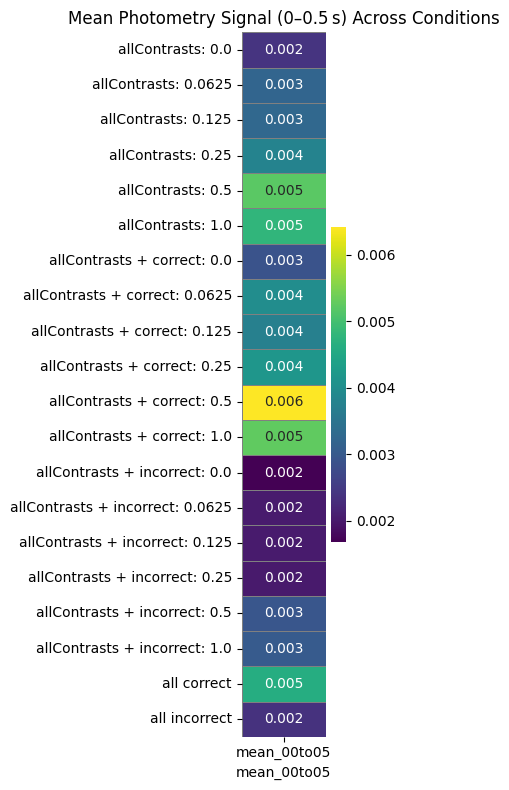

In [17]:

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Build DataFrame with 1 column
heatmap_df = pd.DataFrame({'Condition': labels, 'mean_00to05': values}).set_index('Condition')

# Plot
plt.figure(figsize=(4, len(heatmap_df) * 0.4))
sns.heatmap(
    heatmap_df,
    annot=True,
    fmt=".3f",
    cmap="viridis",
    cbar=True,
    linewidths=0.5,
    linecolor='gray'
)
plt.title('Mean Photometry Signal (0–0.5 s) Across Conditions')
plt.xlabel('mean_00to05')
plt.ylabel('')
plt.tight_layout()
plt.show()


In [18]:

all_data = {}

for group_name, group_mice in groups.items():
    for event in EVENTS:
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        if psth_combined is not None:
            all_data[group_name] = (psth_combined, df_trials_combined) 

from typing import Dict, List, Tuple

In [19]:
all_data.keys()

dict_keys(['DA', '5-HT', 'NE', 'ACh'])

In [20]:
all_data['DA']

(array([[-0.01374507, -0.01696262,  0.01250042, ..., -0.0071695 ,
          0.00011435,  0.00451328],
        [-0.01151285, -0.01882517,  0.01095973, ...,  0.00614346,
         -0.00449814, -0.00294245],
        [-0.01267566, -0.01055208,  0.01597541, ..., -0.00141731,
         -0.00037838,  0.00050468],
        ...,
        [-0.00986625, -0.00994399, -0.00158865, ..., -0.00296324,
          0.00958252, -0.01180005],
        [-0.00541899, -0.01297286, -0.00225109, ...,  0.00011001,
         -0.00056692, -0.01631597],
        [-0.00874683, -0.007633  , -0.01072507, ..., -0.00340433,
         -0.00205218, -0.00296702]], shape=(91, 35690)),
        goCueTrigger_times  stimOnTrigger_times  allContrasts  allSContrasts  \
 0                3.047700             2.947600        1.0000         1.0000   
 1                8.571400             8.518600        1.0000        -1.0000   
 2               13.626700            13.575200        0.5000        -0.5000   
 3               17.376900        

In [21]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
import seaborn as sns

baseline_window = (-0.2, 0)     # 200ms pre-event
response_window = (0, 0.5)      # 500ms post-event
frame_rate = 30                 # Hz
time_zero_idx = int(-PERIEVENT_WINDOW[0] * frame_rate)
baseline_idx = (time_zero_idx + int(baseline_window[0]*frame_rate),
                time_zero_idx + int(baseline_window[1]*frame_rate))
response_idx = (time_zero_idx + int(response_window[0]*frame_rate),
                time_zero_idx + int(response_window[1]*frame_rate))

# Container for stats
all_trials = []

for nm in groups.keys():
    df_trials = df_trials_dict[nm]
    psth = psth_dict[nm]

    # Compute per-trial baseline and response means
    baseline_means = psth[baseline_idx[0]:baseline_idx[1], :].mean(axis=0)
    response_means = psth[response_idx[0]:response_idx[1], :].mean(axis=0)

    norm_dff = (response_means - baseline_means) / baseline_means

    df = pd.DataFrame({
        'NM': nm,
        'norm_dff': norm_dff,
        'feedbackType': df_trials['feedbackType'].values,
        'contrast': df_trials['allContrasts'].values
    })

    all_trials.append(df)

df_all = pd.concat(all_trials, ignore_index=True)
df_all = df_all.dropna()  # Clean NaNs


In [25]:
PERIEVENT_WINDOW = [-1, 2]


=== ANOVA ===
                sum_sq        df         F    PR(>F)
C(NM)     4.375092e+04       3.0  0.445987  0.720139
Residual  6.986578e+09  213659.0       NaN       NaN

=== Tukey HSD ===
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
  5-HT    ACh   0.3985 0.9964 -4.3038 5.1009  False
  5-HT     DA  -0.1873 0.9982 -2.9896  2.615  False
  5-HT     NE    1.034 0.7157 -1.4792 3.5473  False
   ACh     DA  -0.5859 0.9912 -5.7194 4.5477  False
   ACh     NE   0.6355 0.9879 -4.3461 5.6171  False
    DA     NE   1.2213  0.769 -2.0278 4.4705  False
---------------------------------------------------


/tmp/ipykernel_124155/3147168821.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_all, x="NM", y="norm_dff", palette="Set2")


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DA vs. 5-HT: t-test independent samples, P_val:8.710e-01 t=-1.624e-01
5-HT vs. NE: t-test independent samples, P_val:3.268e-01 t=-9.805e-01
NE vs. ACh: t-test independent samples, P_val:6.927e-01 t=3.952e-01
DA vs. NE: t-test independent samples, P_val:2.478e-01 t=-1.156e+00
5-HT vs. ACh: t-test independent samples, P_val:8.420e-01 t=-1.993e-01
DA vs. ACh: t-test independent samples, P_val:6.487e-01 t=-4.555e-01


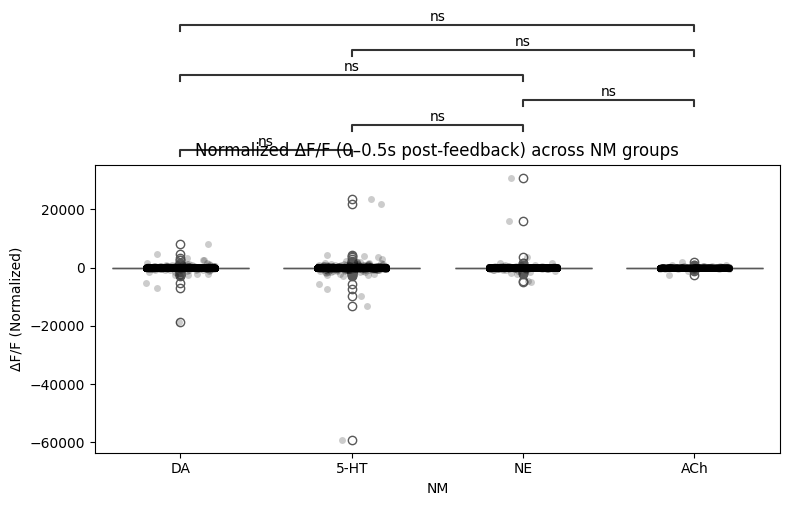

In [26]:
import os
import numpy as np
import pandas as pd
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import seaborn as sns
import matplotlib.pyplot as plt

# Optional (for annotated plots)
# pip install statannotations
from statannotations.Annotator import Annotator

# === GROUPS: Neuromodulator mouse ID mapping ===
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
}

# === TIME WINDOW PARAMETERS ===
PERIEVENT_WINDOW = [-1, 2]  # seconds around event
frame_rate = 30             # Hz
time_zero_idx = int(-PERIEVENT_WINDOW[0] * frame_rate)

# Define time window indices
baseline_window = (-0.15, 0)
response_window = (0, 0.5)

baseline_idx = (
    time_zero_idx + int(baseline_window[0] * frame_rate),
    time_zero_idx + int(baseline_window[1] * frame_rate)
)
response_idx = (
    time_zero_idx + int(response_window[0] * frame_rate),
    time_zero_idx + int(response_window[1] * frame_rate)
)

# === LOAD YOUR DICTIONARIES HERE ===
# Assuming you already defined these:
# df_trials_dict = { "DA": ..., "5-HT": ..., etc. }
# psth_dict = { "DA": ..., "5-HT": ..., etc. }

# === COMPUTE NORMALIZED ΔF/F PER TRIAL ===
all_trials = []

for nm_group in groups.keys():
    df_trials = df_trials_dict[nm_group]
    psth = psth_dict[nm_group]

    # Compute baseline and response means per trial
    baseline = psth[baseline_idx[0]:baseline_idx[1], :].mean(axis=0)
    response = psth[response_idx[0]:response_idx[1], :].mean(axis=0)

    # Normalized dF/F
    norm_dff = (response - baseline) / baseline

    df = pd.DataFrame({
        "NM": nm_group,
        "norm_dff": norm_dff,
        "feedbackType": df_trials["feedbackType"].values,
        "contrast": df_trials["allContrasts"].values
    })

    all_trials.append(df)

# Combine all into one DataFrame
df_all = pd.concat(all_trials, ignore_index=True)
df_all = df_all.dropna(subset=["norm_dff", "contrast"])  # Clean

# === OPTIONAL FILTER: Only certain contrasts ===
# df_all = df_all[df_all["contrast"] == 0]

# === ANOVA ===
model = ols('norm_dff ~ C(NM)', data=df_all).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\n=== ANOVA ===")
print(anova_table)

# === TUKEY POST-HOC TEST ===
print("\n=== Tukey HSD ===")
tukey = pairwise_tukeyhsd(df_all["norm_dff"], df_all["NM"])
print(tukey)

# === BOXPLOT WITH STARS ===
plt.figure(figsize=(8, 6))
ax = sns.boxplot(data=df_all, x="NM", y="norm_dff", palette="Set2")
sns.stripplot(data=df_all, x="NM", y="norm_dff", color='black', alpha=0.2, jitter=0.2)

# Add stars
pairs = [("DA", "5-HT"), ("DA", "NE"), ("DA", "ACh"), ("5-HT", "NE"), ("5-HT", "ACh"), ("NE", "ACh")]
annotator = Annotator(ax, pairs, data=df_all, x='NM', y='norm_dff')
annotator.configure(test='t-test_ind', text_format='star', loc='outside')
annotator.apply_and_annotate()

plt.title("Normalized ΔF/F (0–0.5s post-feedback) across NM groups")
plt.ylabel("ΔF/F (Normalized)")
plt.tight_layout()
plt.show()



========== Analyzing stimOnTrigger_times ==========
                sum_sq        df         F    PR(>F)
C(NM)     4.716883e+04       3.0  0.045907  0.986955
Residual  7.317779e+10  213659.0       NaN       NaN
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
  5-HT    ACh   0.6376 0.9996  -14.581 15.8562  False
  5-HT     DA   0.2902 0.9998  -8.7791  9.3596  False
  5-HT     NE  -0.9552 0.9905   -9.089  7.1785  False
   ACh     DA  -0.3474 0.9999 -16.9614 16.2666  False
   ACh     NE  -1.5928 0.9943 -17.7152 14.5295  False
    DA     NE  -1.2455 0.9902  -11.761  9.2701  False
-----------------------------------------------------


/tmp/ipykernel_124155/2240967861.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_event, x="NM", y="norm_dff", palette="Set2")


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DA vs. 5-HT: t-test independent samples, P_val:9.402e-01 t=7.501e-02
5-HT vs. NE: t-test independent samples, P_val:7.872e-01 t=2.699e-01
NE vs. ACh: t-test independent samples, P_val:7.100e-01 t=-3.719e-01
DA vs. NE: t-test independent samples, P_val:6.095e-01 t=5.108e-01
5-HT vs. ACh: t-test independent samples, P_val:9.279e-01 t=-9.051e-02
DA vs. ACh: t-test independent samples, P_val:8.649e-01 t=-1.702e-01


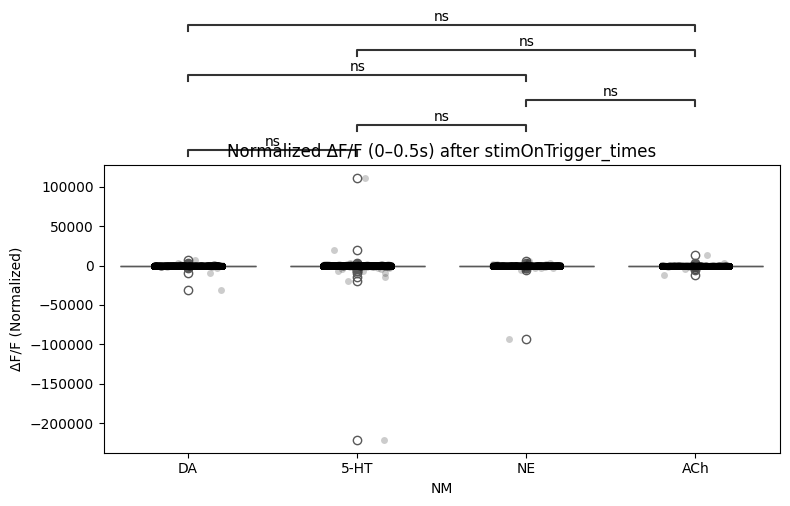


========== Analyzing feedback_times ==========
                sum_sq        df         F    PR(>F)
C(NM)     4.375092e+04       3.0  0.445987  0.720139
Residual  6.986578e+09  213659.0       NaN       NaN
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
  5-HT    ACh   0.3985 0.9964 -4.3038 5.1009  False
  5-HT     DA  -0.1873 0.9982 -2.9896  2.615  False
  5-HT     NE    1.034 0.7157 -1.4792 3.5473  False
   ACh     DA  -0.5859 0.9912 -5.7194 4.5477  False
   ACh     NE   0.6355 0.9879 -4.3461 5.6171  False
    DA     NE   1.2213  0.769 -2.0278 4.4705  False
---------------------------------------------------


/tmp/ipykernel_124155/2240967861.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_event, x="NM", y="norm_dff", palette="Set2")


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DA vs. 5-HT: t-test independent samples, P_val:8.710e-01 t=-1.624e-01
5-HT vs. NE: t-test independent samples, P_val:3.268e-01 t=-9.805e-01
NE vs. ACh: t-test independent samples, P_val:6.927e-01 t=3.952e-01
DA vs. NE: t-test independent samples, P_val:2.478e-01 t=-1.156e+00
5-HT vs. ACh: t-test independent samples, P_val:8.420e-01 t=-1.993e-01
DA vs. ACh: t-test independent samples, P_val:6.487e-01 t=-4.555e-01


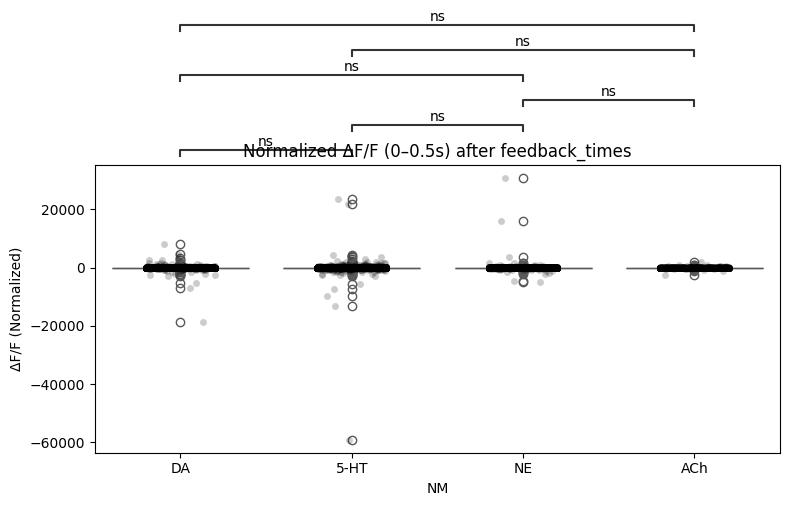

In [27]:
EVENTS = ['stimOnTrigger_times', 'feedback_times']
all_results = {}

for EVENT in EVENTS:
    print(f"\n========== Analyzing {EVENT} ==========")

    # Reload dictionaries for the current event
    df_trials_dict = {}
    psth_dict = {}

    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(
            group_mice, event=EVENT, path_to_data=path_to_data, PERIEVENT_WINDOW=PERIEVENT_WINDOW
        )
        if psth_combined is not None:
            df_trials_dict[group_name] = df_trials_combined
            psth_dict[group_name] = psth_combined

    # Analysis (same as your original code, adjusted to store results per event)
    all_trials = []
    for nm_group in groups.keys():
        df_trials = df_trials_dict[nm_group]
        psth = psth_dict[nm_group]
        baseline = psth[baseline_idx[0]:baseline_idx[1], :].mean(axis=0)
        response = psth[response_idx[0]:response_idx[1], :].mean(axis=0)
        norm_dff = (response - baseline) / baseline
        df = pd.DataFrame({
            "NM": nm_group,
            "norm_dff": norm_dff,
            "feedbackType": df_trials["feedbackType"].values,
            "contrast": df_trials["allContrasts"].values,
            "event": EVENT
        })
        all_trials.append(df)

    df_event = pd.concat(all_trials, ignore_index=True)
    df_event = df_event.dropna(subset=["norm_dff", "contrast"])
    all_results[EVENT] = df_event

    # Run stats
    model = ols('norm_dff ~ C(NM)', data=df_event).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    print(anova_table)

    tukey = pairwise_tukeyhsd(df_event["norm_dff"], df_event["NM"])
    print(tukey)

    # Plot
    plt.figure(figsize=(8, 6))
    ax = sns.boxplot(data=df_event, x="NM", y="norm_dff", palette="Set2")
    sns.stripplot(data=df_event, x="NM", y="norm_dff", color='black', alpha=0.2, jitter=0.2)

    pairs = [("DA", "5-HT"), ("DA", "NE"), ("DA", "ACh"), ("5-HT", "NE"), ("5-HT", "ACh"), ("NE", "ACh")]
    annotator = Annotator(ax, pairs, data=df_event, x='NM', y='norm_dff')
    annotator.configure(test='t-test_ind', text_format='star', loc='outside')
    annotator.apply_and_annotate()

    plt.title(f"Normalized ΔF/F (0–0.5s) after {EVENT}")
    plt.ylabel("ΔF/F (Normalized)")
    plt.tight_layout()
    plt.show()



========== Analyzing stimOnTrigger_times ==========

--- ANOVA ---
            sum_sq        df            F  PR(>F)
C(NM)     0.134027       3.0  1682.987711     0.0
Residual  5.671676  213659.0          NaN     NaN

--- Tukey HSD ---
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
  5-HT    ACh   0.0009    0.0  0.0008  0.001   True
  5-HT     DA   0.0021    0.0   0.002 0.0022   True
  5-HT     NE    0.001    0.0  0.0009 0.0011   True
   ACh     DA   0.0012    0.0  0.0011 0.0014   True
   ACh     NE   0.0001 0.1548    -0.0 0.0003  False
    DA     NE  -0.0011    0.0 -0.0012 -0.001   True
---------------------------------------------------


/tmp/ipykernel_124155/1422606400.py:88: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_event, x="NM", y="raw_dff", palette="Set2")


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DA vs. 5-HT: t-test independent samples, P_val:0.000e+00 t=6.378e+01
5-HT vs. NE: t-test independent samples, P_val:0.000e+00 t=-3.896e+01
NE vs. ACh: t-test independent samples, P_val:8.226e-03 t=2.643e+00
DA vs. NE: t-test independent samples, P_val:4.836e-191 t=2.956e+01
5-HT vs. ACh: t-test independent samples, P_val:2.161e-69 t=-1.762e+01
DA vs. ACh: t-test independent samples, P_val:1.613e-69 t=1.765e+01


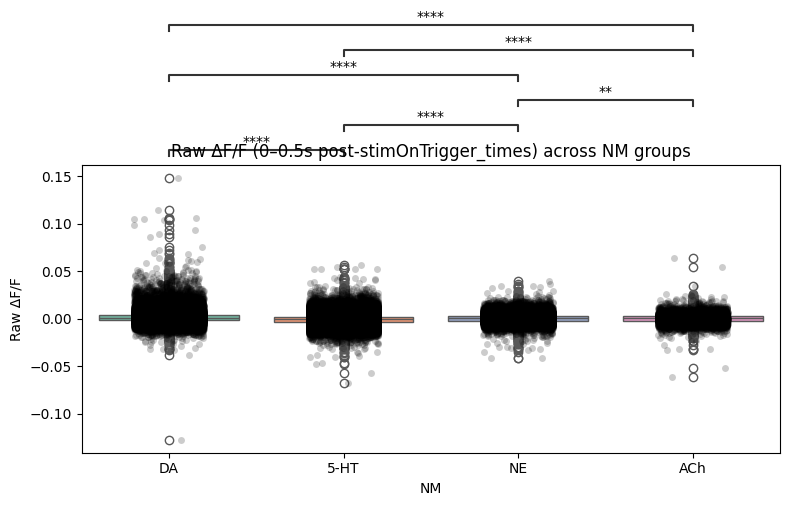


========== Analyzing feedback_times ==========

--- ANOVA ---
             sum_sq        df           F  PR(>F)
C(NM)      0.115602       3.0  800.734893     0.0
Residual  10.281938  213659.0         NaN     NaN

--- Tukey HSD ---
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
  5-HT    ACh  -0.0002 0.0039 -0.0004 -0.0001   True
  5-HT     DA   0.0006    0.0  0.0005  0.0007   True
  5-HT     NE  -0.0015    0.0 -0.0016 -0.0015   True
   ACh     DA   0.0009    0.0  0.0007  0.0011   True
   ACh     NE  -0.0013    0.0 -0.0015 -0.0011   True
    DA     NE  -0.0022    0.0 -0.0023 -0.0021   True
----------------------------------------------------


/tmp/ipykernel_124155/1422606400.py:88: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_event, x="NM", y="raw_dff", palette="Set2")


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DA vs. 5-HT: t-test independent samples, P_val:1.509e-43 t=1.384e+01
5-HT vs. NE: t-test independent samples, P_val:0.000e+00 t=4.880e+01
NE vs. ACh: t-test independent samples, P_val:8.242e-123 t=-2.362e+01
DA vs. NE: t-test independent samples, P_val:0.000e+00 t=3.832e+01
5-HT vs. ACh: t-test independent samples, P_val:1.051e-04 t=3.879e+00
DA vs. ACh: t-test independent samples, P_val:2.578e-15 t=7.912e+00


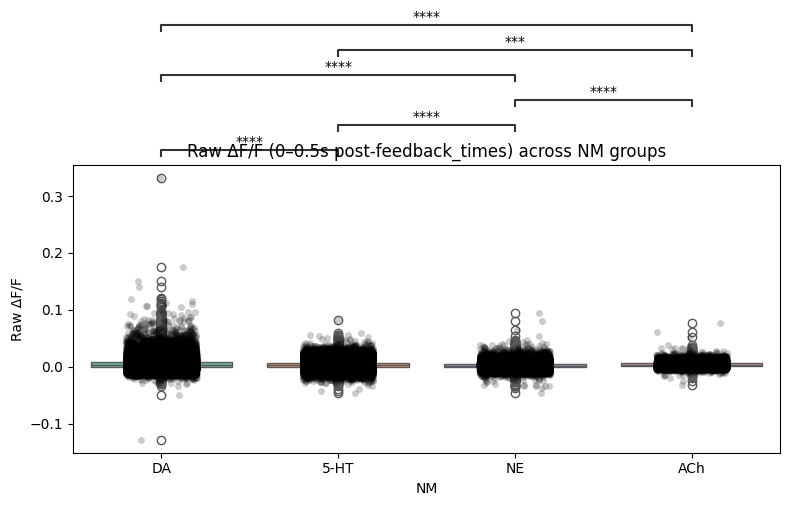

In [28]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statannotations.Annotator import Annotator  # Optional

# === Define your NM groups ===
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
}

# === Define global parameters ===
PERIEVENT_WINDOW = [-1, 2]
frame_rate = 30  # Hz
time_zero_idx = int(-PERIEVENT_WINDOW[0] * frame_rate)

# Time window for raw response
response_window = (0, 0.5)
response_idx = (
    time_zero_idx + int(response_window[0] * frame_rate),
    time_zero_idx + int(response_window[1] * frame_rate)
)

# === Event loop: stimOnTrigger_times and feedback_times ===
EVENTS = ['stimOnTrigger_times', 'feedback_times']
all_results = {}

for EVENT in EVENTS:
    print(f"\n========== Analyzing {EVENT} ==========")

    df_trials_dict = {}
    psth_dict = {}

    # Load data per group
    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(
            group_mice, event=EVENT, path_to_data=path_to_data, PERIEVENT_WINDOW=PERIEVENT_WINDOW
        )
        if psth_combined is not None:
            df_trials_dict[group_name] = df_trials_combined
            psth_dict[group_name] = psth_combined

    # Compute raw mean ΔF/F after event
    all_trials = []
    for nm_group in groups.keys():
        if nm_group not in psth_dict:
            continue

        df_trials = df_trials_dict[nm_group]
        psth = psth_dict[nm_group]

        raw_response = psth[response_idx[0]:response_idx[1], :].mean(axis=0)

        df = pd.DataFrame({
            "NM": nm_group,
            "raw_dff": raw_response,
            "feedbackType": df_trials["feedbackType"].values,
            "contrast": df_trials["allContrasts"].values,
            "event": EVENT
        })

        all_trials.append(df)

    df_event = pd.concat(all_trials, ignore_index=True)
    df_event = df_event.dropna(subset=["raw_dff", "contrast"])
    all_results[EVENT] = df_event

    # === Run ANOVA ===
    print("\n--- ANOVA ---")
    model = ols('raw_dff ~ C(NM)', data=df_event).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    print(anova_table)

    # === Tukey post-hoc ===
    print("\n--- Tukey HSD ---")
    tukey = pairwise_tukeyhsd(df_event["raw_dff"], df_event["NM"])
    print(tukey)

    # === Plot boxplot ===
    plt.figure(figsize=(8, 6))
    ax = sns.boxplot(data=df_event, x="NM", y="raw_dff", palette="Set2")
    sns.stripplot(data=df_event, x="NM", y="raw_dff", color='black', alpha=0.2, jitter=0.2)

    # Annotate significance stars (optional)
    pairs = [("DA", "5-HT"), ("DA", "NE"), ("DA", "ACh"), ("5-HT", "NE"), ("5-HT", "ACh"), ("NE", "ACh")]
    annotator = Annotator(ax, pairs, data=df_event, x='NM', y='raw_dff')
    annotator.configure(test='t-test_ind', text_format='star', loc='outside')
    annotator.apply_and_annotate()

    plt.title(f"Raw ΔF/F (0–0.5s post-{EVENT}) across NM groups")
    plt.ylabel("Raw ΔF/F")
    plt.tight_layout()
    plt.show()


Index(['NM', 'raw_dff', 'feedbackType', 'contrast', 'event'], dtype='object')

=== ANOVA (DA, correct trials) ===
               sum_sq       df           F         PR(>F)
C(contrast)  0.042118      5.0  181.027364  4.914393e-190
Residual     1.189127  25555.0         NaN            NaN

=== Tukey HSD ===
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   0.0 0.0625   0.0005 0.0386     0.0  0.001   True
   0.0  0.125   0.0013    0.0  0.0008 0.0018   True
   0.0   0.25   0.0023    0.0  0.0018 0.0028   True
   0.0    0.5    0.002    0.0  0.0015 0.0026   True
   0.0    1.0   0.0037    0.0  0.0033 0.0042   True
0.0625  0.125   0.0008    0.0  0.0004 0.0012   True
0.0625   0.25   0.0018    0.0  0.0014 0.0022   True
0.0625    0.5   0.0015    0.0   0.001  0.002   True
0.0625    1.0   0.0032    0.0  0.0028 0.0036   True
 0.125   0.25    0.001    0.0  0.0006 0.0014   True
 0.125    0.5   0

/tmp/ipykernel_124155/3274451415.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2")


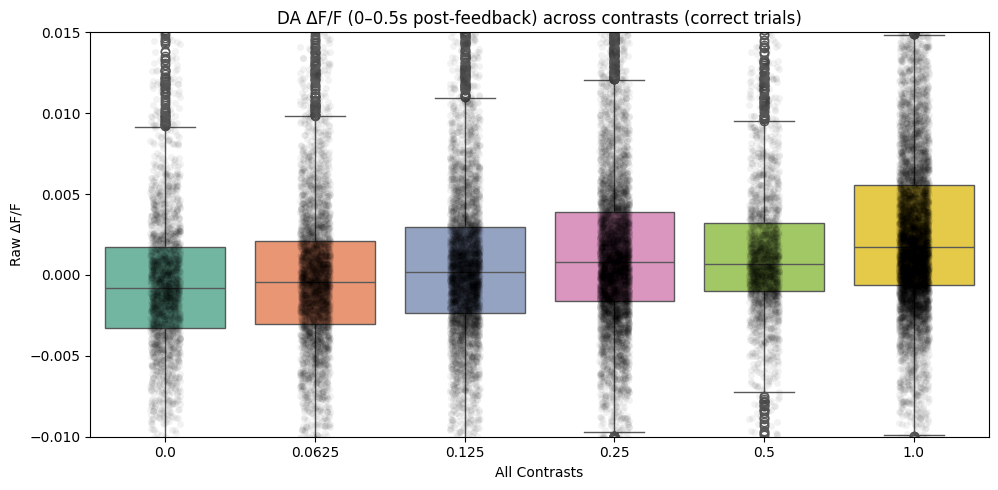

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# 1. Subset: only DA group, correct trials
df_da = all_results["stimOnTrigger_times"]
df_da = df_da[(df_da["NM"] == "DA") & (df_da["feedbackType"] == 1)].copy()
print(df_da.columns)

# Optional: sort or bin contrasts
# df_da["abs_contrast"] = df_da["contrast"].abs()

# 2. ANOVA: Does mean ΔF/F differ by contrast?
model = ols('raw_dff ~ C(contrast)', data=df_da).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\n=== ANOVA (DA, correct trials) ===")
print(anova_table)

# 3. Tukey HSD (if more than 2 contrast levels)
if df_da["contrast"].nunique() > 2:
    print("\n=== Tukey HSD ===")
    tukey = pairwise_tukeyhsd(df_da["raw_dff"], df_da["contrast"])
    print(tukey)

# 4. Plot
plt.figure(figsize=(10, 5))
sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2")
sns.stripplot(data=df_da, x="contrast", y="raw_dff", color="black", alpha=0.05, jitter=True)
plt.title("DA ΔF/F (0–0.5s post-feedback) across contrasts (correct trials)")
plt.xlabel("All Contrasts")
plt.ylabel("Raw ΔF/F")
plt.tight_layout()
plt.ylim(-0.01,0.015)
plt.show()



=== ANOVA (DA, correct trials) ===
               sum_sq       df          F        PR(>F)
C(contrast)  0.016456      5.0  26.477843  8.716746e-27
Residual     3.176477  25555.0        NaN           NaN

=== Tukey HSD ===
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   0.0 0.0625  -0.0001 0.9998 -0.0009 0.0008  False
   0.0  0.125   0.0003 0.9201 -0.0005 0.0011  False
   0.0   0.25   0.0009 0.0191  0.0001 0.0016   True
   0.0    0.5   0.0009 0.0471     0.0 0.0019   True
   0.0    1.0    0.002    0.0  0.0013 0.0028   True
0.0625  0.125   0.0004 0.7064 -0.0004 0.0011  False
0.0625   0.25   0.0009 0.0011  0.0003 0.0016   True
0.0625    0.5    0.001 0.0089  0.0002 0.0019   True
0.0625    1.0   0.0021    0.0  0.0015 0.0028   True
 0.125   0.25   0.0006 0.1013 -0.0001 0.0012  False
 0.125    0.5   0.0007  0.204 -0.0002 0.0015  False
 0.125    1.0   0.0017    0.0  0.0011 0.0024   Tr

/tmp/ipykernel_124155/4209912312.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2")


ValueError: Expected `Scalar or list-like` for 'argument `p_values`'; got `[np.False_, np.False_, np.True_, np.True_, np.True_, np.False_, np.True_, np.True_, np.True_, np.False_, np.False_, np.True_, np.False_, np.True_, np.True_]` instead.

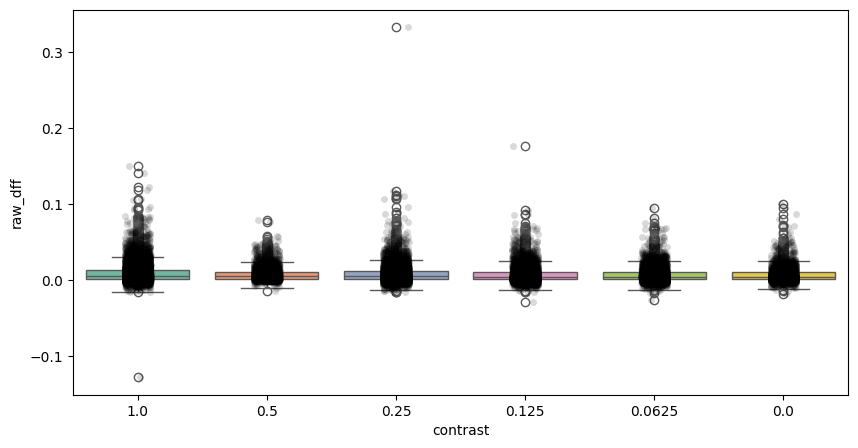

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statannotations.Annotator import Annotator  # install via `pip install statannotations`

# 1. Subset: only DA group, correct trials
df_da = all_results["feedback_times"]
df_da = df_da[(df_da["NM"] == "DA") & (df_da["feedbackType"] == 1)].copy()

# 2. ANOVA
model = ols('raw_dff ~ C(contrast)', data=df_da).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\n=== ANOVA (DA, correct trials) ===")
print(anova_table)

# 3. Tukey HSD
tukey = pairwise_tukeyhsd(df_da["raw_dff"], df_da["contrast"])
print("\n=== Tukey HSD ===")
print(tukey)

# 4. Get pairs from Tukey test
# Convert contrast values to strings for statannotations compatibility
df_da["contrast"] = df_da["contrast"].astype(str)
tukey_pairs = tukey._results_table.data[1:]  # skip header row
pairs = [(str(a), str(b)) for a, b, *_ in tukey_pairs]
pvalues = [p for *_, p in tukey_pairs]

# 5. Plot with stars
plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2")
sns.stripplot(data=df_da, x="contrast", y="raw_dff", color="black", alpha=0.15, jitter=True)

# Add significance stars
annotator = Annotator(ax, pairs, data=df_da, x="contrast", y="raw_dff")
annotator.set_pvalues(pvalues)
annotator.annotate()

plt.title("DA ΔF/F (0–0.5s post-feedback) across contrasts (correct trials)")
plt.xlabel("All Contrasts")
plt.ylabel("Raw ΔF/F")
plt.ylim(-0.05, 0.1)
plt.tight_layout()
plt.show()



=== ANOVA ===
               sum_sq       df          F        PR(>F)
C(contrast)  0.016456      5.0  26.477843  8.716746e-27
Residual     3.176477  25555.0        NaN           NaN

=== Tukey HSD ===
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   0.0 0.0625  -0.0001 0.9998 -0.0009 0.0008  False
   0.0  0.125   0.0003 0.9201 -0.0005 0.0011  False
   0.0   0.25   0.0009 0.0191  0.0001 0.0016   True
   0.0    0.5   0.0009 0.0471     0.0 0.0019   True
   0.0    1.0    0.002    0.0  0.0013 0.0028   True
0.0625  0.125   0.0004 0.7064 -0.0004 0.0011  False
0.0625   0.25   0.0009 0.0011  0.0003 0.0016   True
0.0625    0.5    0.001 0.0089  0.0002 0.0019   True
0.0625    1.0   0.0021    0.0  0.0015 0.0028   True
 0.125   0.25   0.0006 0.1013 -0.0001 0.0012  False
 0.125    0.5   0.0007  0.204 -0.0002 0.0015  False
 0.125    1.0   0.0017    0.0  0.0011 0.0024   True
  0.25    0.5   0.

/tmp/ipykernel_124155/3057754405.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2")


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0625 vs. 0.0: Custom statistical test, P_val:9.998e-01
0.125 vs. 0.0625: Custom statistical test, P_val:7.064e-01
0.25 vs. 0.125: Custom statistical test, P_val:1.013e-01
0.5 vs. 0.25: Custom statistical test, P_val:9.998e-01
1.0 vs. 0.5: Custom statistical test, P_val:7.000e-04
0.125 vs. 0.0: Custom statistical test, P_val:9.201e-01
0.25 vs. 0.0625: Custom statistical test, P_val:1.100e-03
0.5 vs. 0.125: Custom statistical test, P_val:2.040e-01
1.0 vs. 0.25: Custom statistical test, P_val:0.000e+00
0.25 vs. 0.0: Custom statistical test, P_val:1.910e-02
0.5 vs. 0.0625: Custom statistical test, P_val:8.900e-03
1.0 vs. 0.125: Custom statistical test, P_val:0.000e+00
0.5 vs. 0.0: Custom statistical test, P_val:4.710e-02
1.0 vs. 0.0625: Custom statistical test, P_val:0.000e+00
1.0 vs. 0.0: Custom st

/tmp/ipykernel_124155/3057754405.py:46: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


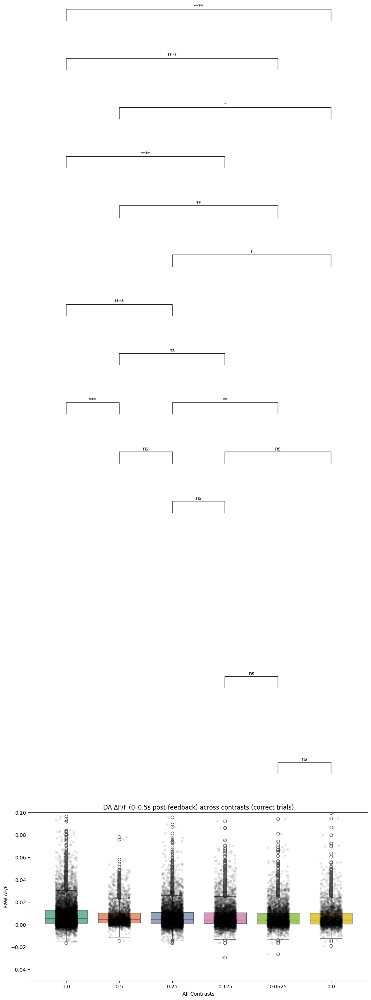

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statannotations.Annotator import Annotator
import pandas as pd

# 1. Subset
df_da = all_results["feedback_times"]
df_da = df_da[(df_da["NM"] == "DA") & (df_da["feedbackType"] == 1)].copy()

# Convert contrast to string for Annotator compatibility
df_da["contrast"] = df_da["contrast"].astype(str)

# 2. ANOVA
model = ols('raw_dff ~ C(contrast)', data=df_da).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\n=== ANOVA ===")
print(anova_table)

# 3. Tukey HSD
tukey = pairwise_tukeyhsd(df_da["raw_dff"], df_da["contrast"])
print("\n=== Tukey HSD ===")
print(tukey)

# 4. Extract pairs and p-values
# Tukey results come as a structured array
tukey_results = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
pairs = [(str(row['group1']), str(row['group2'])) for _, row in tukey_results.iterrows()]
pvalues = tukey_results["p-adj"].astype(float).tolist()

# 5. Plot
plt.figure(figsize=(12, 6))
ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2")
sns.stripplot(data=df_da, x="contrast", y="raw_dff", color="black", alpha=0.1, jitter=0.2)

annotator = Annotator(ax, pairs, data=df_da, x="contrast", y="raw_dff")
annotator.set_pvalues(pvalues)
annotator.annotate()

plt.title("DA ΔF/F (0–0.5s post-feedback) across contrasts (correct trials)")
plt.xlabel("All Contrasts")
plt.ylabel("Raw ΔF/F")
plt.ylim(-0.05, 0.1)
plt.tight_layout()
plt.show()



=== ANOVA ===
               sum_sq       df          F        PR(>F)
C(contrast)  0.016456      5.0  26.477843  8.716746e-27
Residual     3.176477  25555.0        NaN           NaN

=== Tukey HSD ===
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   0.0 0.0625  -0.0001 0.9998 -0.0009 0.0008  False
   0.0  0.125   0.0003 0.9201 -0.0005 0.0011  False
   0.0   0.25   0.0009 0.0191  0.0001 0.0016   True
   0.0    0.5   0.0009 0.0471     0.0 0.0019   True
   0.0    1.0    0.002    0.0  0.0013 0.0028   True
0.0625  0.125   0.0004 0.7064 -0.0004 0.0011  False
0.0625   0.25   0.0009 0.0011  0.0003 0.0016   True
0.0625    0.5    0.001 0.0089  0.0002 0.0019   True
0.0625    1.0   0.0021    0.0  0.0015 0.0028   True
 0.125   0.25   0.0006 0.1013 -0.0001 0.0012  False
 0.125    0.5   0.0007  0.204 -0.0002 0.0015  False
 0.125    1.0   0.0017    0.0  0.0011 0.0024   True
  0.25    0.5   0.

/tmp/ipykernel_124155/2532201921.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2")
/home/ibladmin/anaconda3/envs/iblenv/lib/python3.10/site-packages/statannotations/Annotator.py:825: UserWarning: Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
  warnings.warn("Annotator was reconfigured without applying the "


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1.0 vs. 0.5: Custom statistical test, P_val:7.000e-04
0.25 vs. 0.0625: Custom statistical test, P_val:1.100e-03
1.0 vs. 0.25: Custom statistical test, P_val:0.000e+00
0.25 vs. 0.0: Custom statistical test, P_val:1.910e-02
0.5 vs. 0.0625: Custom statistical test, P_val:8.900e-03
1.0 vs. 0.125: Custom statistical test, P_val:0.000e+00
0.5 vs. 0.0: Custom statistical test, P_val:4.710e-02
1.0 vs. 0.0625: Custom statistical test, P_val:0.000e+00
1.0 vs. 0.0: Custom statistical test, P_val:0.000e+00


/tmp/ipykernel_124155/2532201921.py:45: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


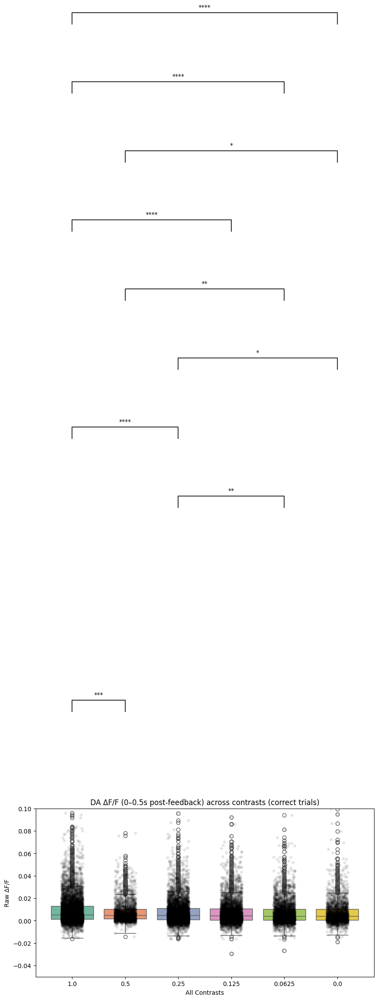

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statannotations.Annotator import Annotator
import pandas as pd

# 1. Subset: only DA correct trials
df_da = all_results["feedback_times"]
df_da = df_da[(df_da["NM"] == "DA") & (df_da["feedbackType"] == 1)].copy()
df_da["contrast"] = df_da["contrast"].astype(str)

# 2. ANOVA
model = ols('raw_dff ~ C(contrast)', data=df_da).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\n=== ANOVA ===")
print(anova_table)

# 3. Tukey HSD
tukey = pairwise_tukeyhsd(df_da["raw_dff"], df_da["contrast"])
print("\n=== Tukey HSD ===")
print(tukey)

# 4. Filter out 'ns' pairs
tukey_results = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
significant_rows = tukey_results[tukey_results["reject"] == True]
pairs = [(str(row['group1']), str(row['group2'])) for _, row in significant_rows.iterrows()]
pvalues = significant_rows["p-adj"].astype(float).tolist()

# 5. Plot
plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2")
sns.stripplot(data=df_da, x="contrast", y="raw_dff", color="black", alpha=0.1, jitter=0.2)

annotator = Annotator(ax, pairs, data=df_da, x="contrast", y="raw_dff")
annotator.set_pvalues(pvalues)
annotator.configure(text_format="star", loc="inside", line_height=0.02, text_offset=4)  # Tighter spacing
annotator.annotate()

plt.title("DA ΔF/F (0–0.5s post-feedback) across contrasts (correct trials)")
plt.xlabel("All Contrasts")
plt.ylabel("Raw ΔF/F")
plt.ylim(-0.05, 0.1)
plt.tight_layout()
plt.show()


/tmp/ipykernel_124155/2071444392.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2", order=contrast_order)
/home/ibladmin/anaconda3/envs/iblenv/lib/python3.10/site-packages/statannotations/Annotator.py:825: UserWarning: Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
  warnings.warn("Annotator was reconfigured without applying the "


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.5 vs. 1.0: Custom statistical test, P_val:7.000e-04


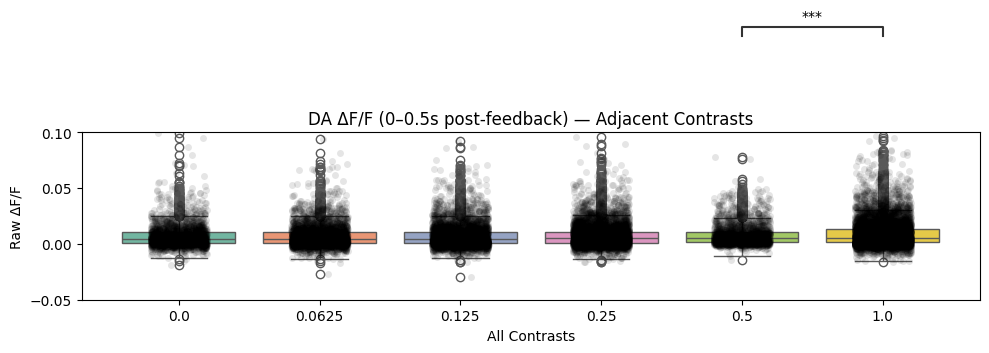

In [47]:
# Order contrast values
contrast_order = sorted(df_da["contrast"].unique(), key=lambda x: float(x))
pairs = [(contrast_order[i], contrast_order[i+1]) for i in range(len(contrast_order)-1)]

# Filter to those pairs
tukey_results = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
tukey_results = tukey_results[tukey_results["reject"] == True]
filtered_pairs = []
filtered_pvalues = []

for pair in pairs:
    match = tukey_results[((tukey_results["group1"] == pair[0]) & (tukey_results["group2"] == pair[1])) |
                          ((tukey_results["group1"] == pair[1]) & (tukey_results["group2"] == pair[0]))]
    if not match.empty:
        filtered_pairs.append(pair)
        filtered_pvalues.append(float(match["p-adj"].values[0]))

# Plot again
plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2", order=contrast_order)
sns.stripplot(data=df_da, x="contrast", y="raw_dff", color="black", alpha=0.1, jitter=0.2, order=contrast_order)

annotator = Annotator(ax, filtered_pairs, data=df_da, x="contrast", y="raw_dff", order=contrast_order)
annotator.set_pvalues(filtered_pvalues)
annotator.configure(text_format="star", loc="inside", line_height=0.015, text_offset=3)
annotator.annotate()

plt.title("DA ΔF/F (0–0.5s post-feedback) — Adjacent Contrasts")
plt.xlabel("All Contrasts")
plt.ylabel("Raw ΔF/F")
plt.ylim(-0.05, 0.1)
plt.tight_layout()
plt.show()



=== ANOVA ===
               sum_sq       df          F        PR(>F)
C(contrast)  0.016456      5.0  26.477843  8.716746e-27
Residual     3.176477  25555.0        NaN           NaN

=== Tukey HSD ===
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   0.0 0.0625  -0.0001 0.9998 -0.0009 0.0008  False
   0.0  0.125   0.0003 0.9201 -0.0005 0.0011  False
   0.0   0.25   0.0009 0.0191  0.0001 0.0016   True
   0.0    0.5   0.0009 0.0471     0.0 0.0019   True
   0.0    1.0    0.002    0.0  0.0013 0.0028   True
0.0625  0.125   0.0004 0.7064 -0.0004 0.0011  False
0.0625   0.25   0.0009 0.0011  0.0003 0.0016   True
0.0625    0.5    0.001 0.0089  0.0002 0.0019   True
0.0625    1.0   0.0021    0.0  0.0015 0.0028   True
 0.125   0.25   0.0006 0.1013 -0.0001 0.0012  False
 0.125    0.5   0.0007  0.204 -0.0002 0.0015  False
 0.125    1.0   0.0017    0.0  0.0011 0.0024   True
  0.25    0.5   0.

/tmp/ipykernel_124155/947216727.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2", order=contrast_order)
/home/ibladmin/anaconda3/envs/iblenv/lib/python3.10/site-packages/statannotations/Annotator.py:825: UserWarning: Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
  warnings.warn("Annotator was reconfigured without applying the "


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.5 vs. 1.0: Custom statistical test, P_val:7.000e-04
0.0625 vs. 0.25: Custom statistical test, P_val:1.100e-03
0.25 vs. 1.0: Custom statistical test, P_val:0.000e+00
0.0 vs. 0.25: Custom statistical test, P_val:1.910e-02
0.0625 vs. 0.5: Custom statistical test, P_val:8.900e-03
0.125 vs. 1.0: Custom statistical test, P_val:0.000e+00
0.0 vs. 0.5: Custom statistical test, P_val:4.710e-02
0.0625 vs. 1.0: Custom statistical test, P_val:0.000e+00
0.0 vs. 1.0: Custom statistical test, P_val:0.000e+00


/tmp/ipykernel_124155/947216727.py:46: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


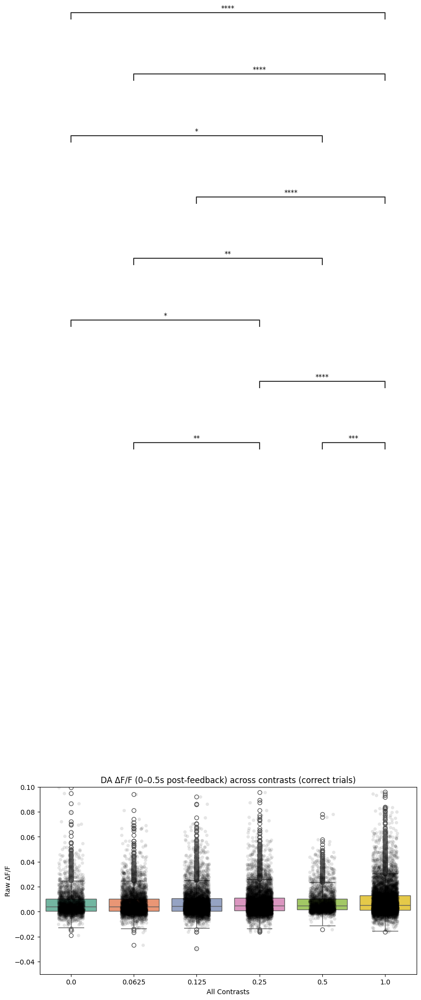

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statannotations.Annotator import Annotator
import pandas as pd

# 1. Subset
df_da = all_results["feedback_times"]
df_da = df_da[(df_da["NM"] == "DA") & (df_da["feedbackType"] == 1)].copy()
df_da["contrast"] = df_da["contrast"].astype(str)

# 2. ANOVA
model = ols('raw_dff ~ C(contrast)', data=df_da).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\n=== ANOVA ===")
print(anova_table)

# 3. Tukey HSD
tukey = pairwise_tukeyhsd(df_da["raw_dff"], df_da["contrast"])
print("\n=== Tukey HSD ===")
print(tukey)

# 4. Extract significant (reject=True) comparisons only
tukey_results = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
significant_rows = tukey_results[tukey_results["reject"] == True]
pairs = [(str(row['group1']), str(row['group2'])) for _, row in significant_rows.iterrows()]
pvalues = significant_rows["p-adj"].astype(float).tolist()

# 5. Plot with tight annotation spacing
plt.figure(figsize=(10, 5))
contrast_order = sorted(df_da["contrast"].unique(), key=lambda x: float(x))
ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", palette="Set2", order=contrast_order)
sns.stripplot(data=df_da, x="contrast", y="raw_dff", color="black", alpha=0.1, jitter=0.2, order=contrast_order)

annotator = Annotator(ax, pairs, data=df_da, x="contrast", y="raw_dff", order=contrast_order)
annotator.set_pvalues(pvalues)
annotator.configure(text_format="star", loc="outside", line_height=0.01, text_offset=2)  # Tight spacing here
annotator.annotate()

plt.title("DA ΔF/F (0–0.5s post-feedback) across contrasts (correct trials)")
plt.xlabel("All Contrasts")
plt.ylabel("Raw ΔF/F")
plt.ylim(-0.05, 0.1)
plt.tight_layout()
plt.show()



=== ANOVA ===
               sum_sq       df          F        PR(>F)
C(contrast)  0.016456      5.0  26.477843  8.716746e-27
Residual     3.176477  25555.0        NaN           NaN

=== Tukey HSD ===
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   0.0 0.0625  -0.0001 0.9998 -0.0009 0.0008  False
   0.0  0.125   0.0003 0.9201 -0.0005 0.0011  False
   0.0   0.25   0.0009 0.0191  0.0001 0.0016   True
   0.0    0.5   0.0009 0.0471     0.0 0.0019   True
   0.0    1.0    0.002    0.0  0.0013 0.0028   True
0.0625  0.125   0.0004 0.7064 -0.0004 0.0011  False
0.0625   0.25   0.0009 0.0011  0.0003 0.0016   True
0.0625    0.5    0.001 0.0089  0.0002 0.0019   True
0.0625    1.0   0.0021    0.0  0.0015 0.0028   True
 0.125   0.25   0.0006 0.1013 -0.0001 0.0012  False
 0.125    0.5   0.0007  0.204 -0.0002 0.0015  False
 0.125    1.0   0.0017    0.0  0.0011 0.0024   True
  0.25    0.5   0.

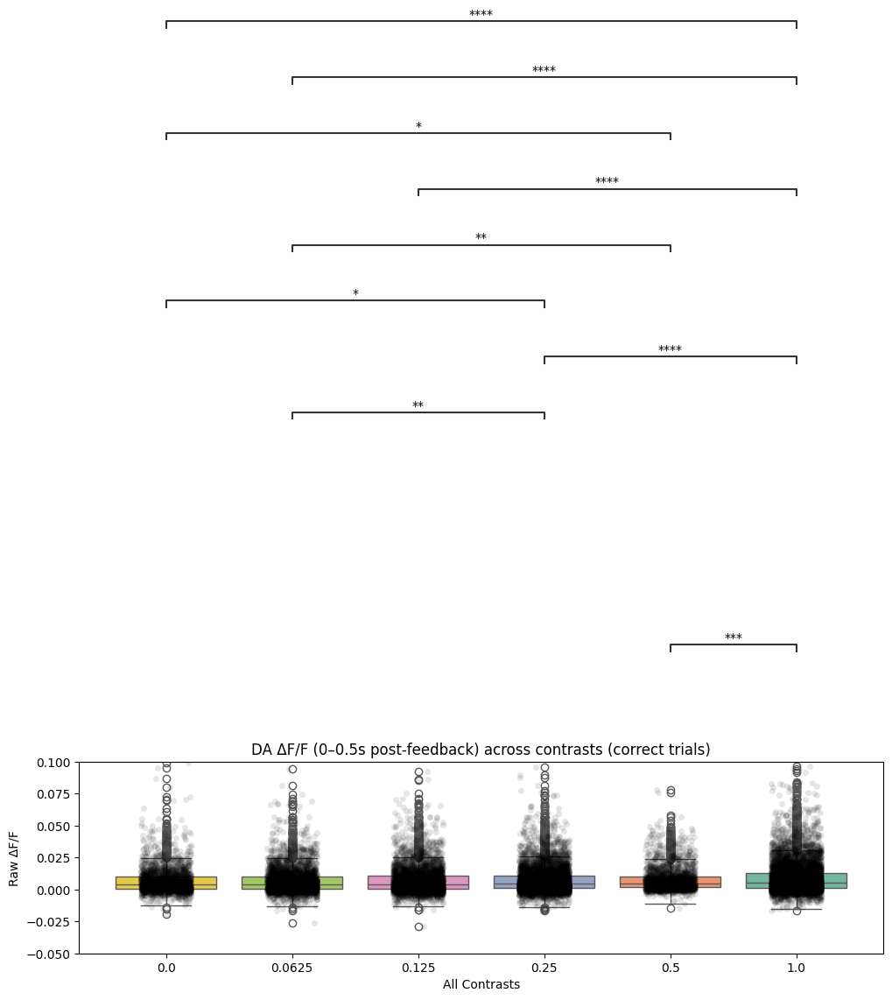

In [56]:
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statannotations.Annotator import Annotator
import pandas as pd

# 1. Subset
df_da = all_results["feedback_times"]
df_da = df_da[(df_da["NM"] == "DA") & (df_da["feedbackType"] == 1)].copy()
df_da["contrast"] = df_da["contrast"].astype(str)

# 2. ANOVA
model = ols('raw_dff ~ C(contrast)', data=df_da).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\n=== ANOVA ===")
print(anova_table)

# 3. Tukey HSD
tukey = pairwise_tukeyhsd(df_da["raw_dff"], df_da["contrast"])
print("\n=== Tukey HSD ===")
print(tukey)

# 4. Extract significant comparisons only
tukey_results = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
significant_rows = tukey_results[tukey_results["reject"] == True]
pairs = [(str(row['group1']), str(row['group2'])) for _, row in significant_rows.iterrows()]
pvalues = significant_rows["p-adj"].astype(float).tolist()

# 5. Plot with improved spacing
plt.figure(figsize=(10, 5))
contrast_order = sorted(df_da["contrast"].unique(), key=lambda x: float(x))
ax = sns.boxplot(data=df_da, x="contrast", y="raw_dff", hue="contrast", legend=False,
                 palette="Set2", order=contrast_order)
sns.stripplot(data=df_da, x="contrast", y="raw_dff", color="black", alpha=0.1, jitter=0.2, order=contrast_order)

annotator = Annotator(ax, pairs, data=df_da, x="contrast", y="raw_dff", order=contrast_order)
annotator.configure(text_format="star", loc="inside", line_height=0.01, text_offset=0.5)
annotator.set_pvalues(pvalues)
annotator.set_pvalues(pvalues)
annotator.annotate()

plt.title("DA ΔF/F (0–0.5s post-feedback) across contrasts (correct trials)")
plt.xlabel("All Contrasts")
plt.ylabel("Raw ΔF/F")
plt.ylim(-0.05, 0.1)

# Reduce vertical whitespace manually if needed
plt.subplots_adjust(top=0.9, bottom=0.8)
plt.tight_layout()
plt.show()


/tmp/ipykernel_124155/659407356.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df, x="Group", y="Value", palette="Set2")
/home/ibladmin/anaconda3/envs/iblenv/lib/python3.10/site-packages/statannotations/Annotator.py:825: UserWarning: Annotator was reconfigured without applying the test (again) which will probably lead to unexpected results
  warnings.warn("Annotator was reconfigured without applying the "


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

setosa vs. versicolor: Custom statistical test, P_val:0.000e+00
versicolor vs. virginica: Custom statistical test, P_val:0.000e+00
setosa vs. virginica: Custom statistical test, P_val:0.000e+00


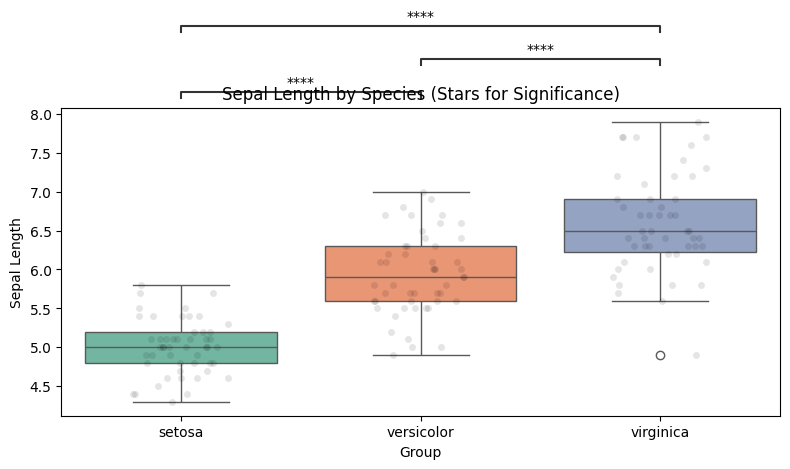

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
import pandas as pd
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Example data: like iris Sepal.Length by Species
df = sns.load_dataset("iris")
df["Species"] = df["species"]
df["Group"] = df["species"]  # match expected naming
df["Value"] = df["sepal_length"]

# Run Tukey HSD manually
tukey = pairwise_tukeyhsd(df["Value"], df["Group"])
tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
significant = tukey_df[tukey_df["reject"] == True]
pairs = [(row["group1"], row["group2"]) for _, row in significant.iterrows()]
pvalues = significant["p-adj"].astype(float).tolist()

# Plot
plt.figure(figsize=(8, 5))
ax = sns.boxplot(data=df, x="Group", y="Value", palette="Set2")
sns.stripplot(data=df, x="Group", y="Value", color='black', alpha=0.1, jitter=0.2)

annotator = Annotator(ax, pairs, data=df, x="Group", y="Value")
annotator.set_pvalues(pvalues)
annotator.configure(text_format="star", loc="outside", line_height=0.02, text_offset=2)
annotator.annotate()

plt.title("Sepal Length by Species (Stars for Significance)")
plt.ylabel("Sepal Length")
plt.tight_layout()
plt.show()
